# Correlations before and after attack
## Using the Kendall correlation scheme

Applied to one of the new QCD files after cleaning as it was done for the training etc.

## Preparations

### Loading modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mplhep as hep
import uproot4 as uproot

In [2]:
import torch
import torch.nn as nn

from sklearn import metrics
from sklearn.preprocessing import StandardScaler

### Configure the device

In [3]:
#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

### Plot styling

In [4]:
plt.style.use([hep.style.ROOT, hep.style.firamath])

### Opening the files

In [6]:
allin = np.load('/hpcwork/um106329/new_march_21/cleaned/inputs_0_to_49.npy')

In [101]:
targets = torch.Tensor(allin[:100000,67])

## Applying the attack

The inputs have to be prepared, cleaning is considered "done". But in order to use the attack, the inputs shall be scaled by (x-mu)/sigma.
Besides that, we need the true target classes, otherwise calculations involving the loss function (fgsm) would fail.
And in order to use the correct model, it has to be loaded together with the criterion & optimizer.

### Names to identify the variables, to display them in plots

In [8]:
input_names = ['Jet_eta', 'Jet_pt',
 'Jet_DeepCSV_flightDistance2dSig', 'Jet_DeepCSV_flightDistance2dVal', 'Jet_DeepCSV_flightDistance3dSig', 'Jet_DeepCSV_flightDistance3dVal',
 'Jet_DeepCSV_trackDecayLenVal_0', 'Jet_DeepCSV_trackDecayLenVal_1', 'Jet_DeepCSV_trackDecayLenVal_2', 'Jet_DeepCSV_trackDecayLenVal_3', 'Jet_DeepCSV_trackDecayLenVal_4', 'Jet_DeepCSV_trackDecayLenVal_5',
 'Jet_DeepCSV_trackDeltaR_0', 'Jet_DeepCSV_trackDeltaR_1', 'Jet_DeepCSV_trackDeltaR_2', 'Jet_DeepCSV_trackDeltaR_3', 'Jet_DeepCSV_trackDeltaR_4', 'Jet_DeepCSV_trackDeltaR_5',
 'Jet_DeepCSV_trackEtaRel_0', 'Jet_DeepCSV_trackEtaRel_1', 'Jet_DeepCSV_trackEtaRel_2', 'Jet_DeepCSV_trackEtaRel_3',
 'Jet_DeepCSV_trackJetDistVal_0', 'Jet_DeepCSV_trackJetDistVal_1', 'Jet_DeepCSV_trackJetDistVal_2', 'Jet_DeepCSV_trackJetDistVal_3', 'Jet_DeepCSV_trackJetDistVal_4', 'Jet_DeepCSV_trackJetDistVal_5',
 'Jet_DeepCSV_trackJetPt',
 'Jet_DeepCSV_trackPtRatio_0', 'Jet_DeepCSV_trackPtRatio_1', 'Jet_DeepCSV_trackPtRatio_2', 'Jet_DeepCSV_trackPtRatio_3', 'Jet_DeepCSV_trackPtRatio_4', 'Jet_DeepCSV_trackPtRatio_5',
 'Jet_DeepCSV_trackPtRel_0', 'Jet_DeepCSV_trackPtRel_1', 'Jet_DeepCSV_trackPtRel_2', 'Jet_DeepCSV_trackPtRel_3', 'Jet_DeepCSV_trackPtRel_4', 'Jet_DeepCSV_trackPtRel_5',
 'Jet_DeepCSV_trackSip2dSigAboveCharm',
 'Jet_DeepCSV_trackSip2dSig_0', 'Jet_DeepCSV_trackSip2dSig_1', 'Jet_DeepCSV_trackSip2dSig_2', 'Jet_DeepCSV_trackSip2dSig_3', 'Jet_DeepCSV_trackSip2dSig_4', 'Jet_DeepCSV_trackSip2dSig_5',
 'Jet_DeepCSV_trackSip2dValAboveCharm',
 'Jet_DeepCSV_trackSip3dSigAboveCharm',
 'Jet_DeepCSV_trackSip3dSig_0', 'Jet_DeepCSV_trackSip3dSig_1', 'Jet_DeepCSV_trackSip3dSig_2', 'Jet_DeepCSV_trackSip3dSig_3', 'Jet_DeepCSV_trackSip3dSig_4', 'Jet_DeepCSV_trackSip3dSig_5',
 'Jet_DeepCSV_trackSip3dValAboveCharm',
 'Jet_DeepCSV_trackSumJetDeltaR', 'Jet_DeepCSV_trackSumJetEtRatio',
 'Jet_DeepCSV_vertexCategory', 'Jet_DeepCSV_vertexEnergyRatio', 'Jet_DeepCSV_vertexJetDeltaR', 'Jet_DeepCSV_vertexMass',
 'Jet_DeepCSV_jetNSecondaryVertices', 'Jet_DeepCSV_jetNSelectedTracks', 'Jet_DeepCSV_jetNTracksEtaRel', 'Jet_DeepCSV_vertexNTracks',]

display_names = ['Jet $\eta$',
                'Jet $p_T$',
                'Flight Distance 2D Sig','Flight Distance 2D Val','Flight Distance 3D Sig', 'Flight Distance 3D Val',
                'Track Decay Len Val [0]','Track Decay Len Val [1]','Track Decay Len Val [2]','Track Decay Len Val [3]','Track Decay Len Val [4]','Track Decay Len Val [5]',
                'Track $\Delta R$ [0]','Track $\Delta R$ [1]','Track $\Delta R$ [2]','Track $\Delta R$ [3]','Track $\Delta R$ [4]','Track $\Delta R$ [5]',
                'Track $\eta_{rel}$ [0]','Track $\eta_{rel}$ [1]','Track $\eta_{rel}$ [2]','Track $\eta_{rel}$ [3]',
                'Track Jet Dist Val [0]','Track Jet Dist Val [1]','Track Jet Dist Val [2]','Track Jet Dist Val [3]','Track Jet Dist Val [4]','Track Jet Dist Val [5]',
                'Track Jet $p_T$',
                'Track $p_T$ Ratio [0]','Track $p_T$ Ratio [1]','Track $p_T$ Ratio [2]','Track $p_T$ Ratio [3]','Track $p_T$ Ratio [4]','Track $p_T$ Ratio [5]',
                'Track $p_{T,rel}$ [0]','Track $p_{T,rel}$ [1]','Track $p_{T,rel}$ [2]','Track $p_{T,rel}$ [3]','Track $p_{T,rel}$ [4]','Track $p_{T,rel}$ [5]',
                'Track SIP 2D Sig Above Charm',
                'Track SIP 2D Sig [0]','Track SIP 2D Sig [1]','Track SIP 2D Sig [2]','Track SIP 2D Sig [3]','Track SIP 2D Sig [4]','Track SIP 2D Sig [5]',
                'Track SIP 2D Val Above Charm',
                'Track SIP 3D Sig Above Charm',
                'Track SIP 3D Sig [0]','Track SIP 3D Sig [1]','Track SIP 3D Sig [2]','Track SIP 3D Sig [3]','Track SIP 3D Sig [4]','Track SIP 3D Sig [5]',
                'Track SIP 3D Val Above Charm',
                'Track Sum Jet $\Delta R$','Track Sum Jet $E_T$ Ratio',
                'Vertex Category','Vertex Energy Ratio','Vertex Jet $\Delta R$','Vertex Mass',
                'Jet N Secondary Vertices','Jet N Selected Tracks','Jet N Tracks $\eta_{rel}$','Vertex N Tracks',]

### Loading the model with all its additional properties
This is the newest, non-weighted model (fully trained after 120 epochs)

In [9]:
criterion = nn.CrossEntropyLoss()

model = nn.Sequential(nn.Linear(67, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Linear(100, 4),
                      nn.Softmax(dim=1))

checkpoint = torch.load(f'/home/um106329/aisafety/models/weighted/200_full_files_120_epochs_v13_GPU_weighted_as_is.pt', map_location=torch.device(device))
model.load_state_dict(checkpoint["model_state_dict"])

model.to(device)
model.eval()

Sequential(
  (0): Linear(in_features=67, out_features=100, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.1, inplace=False)
  (3): Linear(in_features=100, out_features=100, bias=True)
  (4): ReLU()
  (5): Dropout(p=0.1, inplace=False)
  (6): Linear(in_features=100, out_features=100, bias=True)
  (7): ReLU()
  (8): Dropout(p=0.1, inplace=False)
  (9): Linear(in_features=100, out_features=100, bias=True)
  (10): ReLU()
  (11): Dropout(p=0.1, inplace=False)
  (12): Linear(in_features=100, out_features=100, bias=True)
  (13): ReLU()
  (14): Linear(in_features=100, out_features=4, bias=True)
  (15): Softmax(dim=1)
)

In [10]:
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
params

47604

### Scaling the cleaned inputs

In [18]:
default_val = -999

In [19]:
all_inputs = torch.Tensor(allin[:100000,0:67])
norm_inputs = all_inputs.clone().detach()

scalers = []
    
for i in range(0,67):
    scaler = StandardScaler().fit(all_inputs[:,i][all_inputs[:,i]!=default_val].reshape(-1,1))
    norm_inputs[:,i][all_inputs[:,i]!=default_val]   = torch.Tensor(scaler.transform(all_inputs[:,i][all_inputs[:,i]!=default_val].reshape(-1,1)).reshape(1,-1))
    scalers.append(scaler)


In [48]:
scalers[0].mean_

array([-0.00899528])

Should now have: scaled inputs (norm_inputs), scalers ready to be used with pytorch

In [20]:
n_jets = len(norm_inputs)
n_jets

100000

This is the total number of jets remaining after the cleaning steps above.

In [32]:
i21 = all_inputs[:,21].numpy()

(array([    0.,     0.,     0.,     0.,     0., 91903.,     0.,     0.,
            0.,     0.]),
 array([-1010., -1008., -1006., -1004., -1002., -1000.,  -998.,  -996.,
         -994.,  -992.,  -990.], dtype=float32),
 <BarContainer object of 10 artists>)

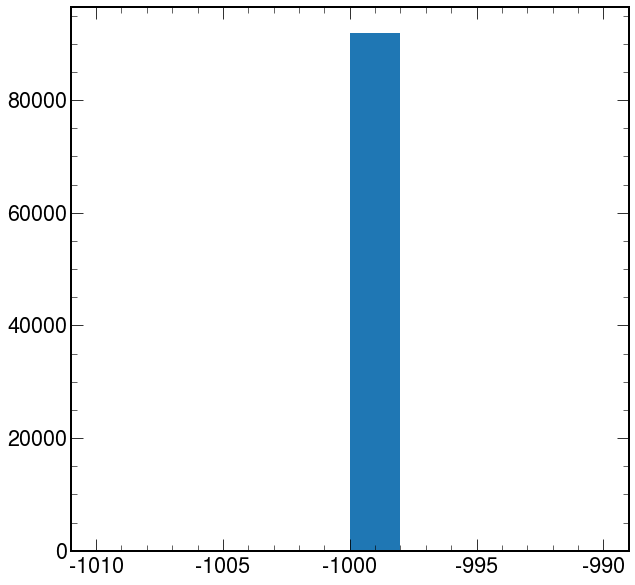

In [37]:
plt.hist(i21,range=(-1010,-990))

(array([0.000e+00, 3.560e+02, 2.253e+03, 3.084e+03, 1.805e+03, 5.120e+02,
        8.100e+01, 5.000e+00, 1.000e+00, 0.000e+00]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.],
       dtype=float32),
 <BarContainer object of 10 artists>)

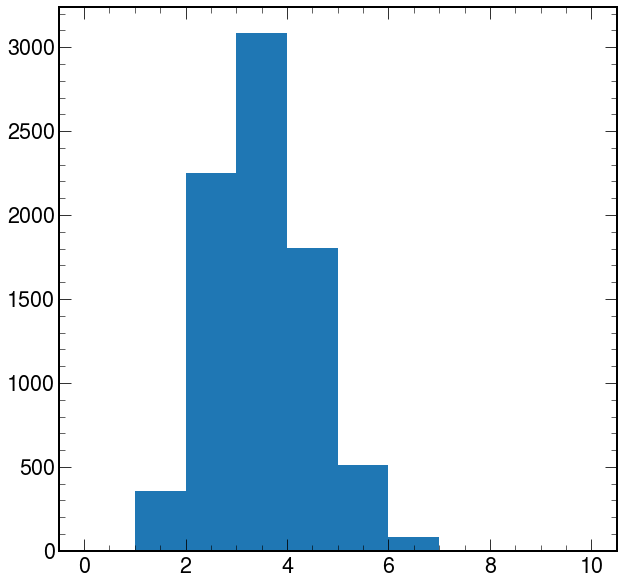

In [50]:
plt.hist(i21,range=(0,10))

In [42]:
normi21 = scalers[21].inverse_transform(norm_inputs[:,21].cpu())

(array([    0.,     0.,     0., 91903.,     0.,     0.,     0.,     0.,
            0.,     0.]),
 array([-1010.,  -999.,  -988.,  -977.,  -966.,  -955.,  -944.,  -933.,
         -922.,  -911.,  -900.], dtype=float32),
 <BarContainer object of 10 artists>)

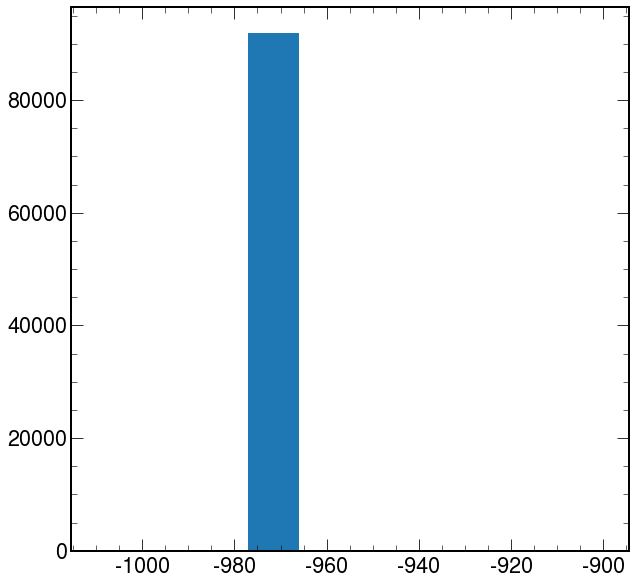

In [53]:
plt.hist(normi21,range=(-1010,-900))

(array([0.000e+00, 3.560e+02, 2.253e+03, 3.084e+03, 1.805e+03, 5.120e+02,
        8.100e+01, 5.000e+00, 1.000e+00, 0.000e+00]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.],
       dtype=float32),
 <BarContainer object of 10 artists>)

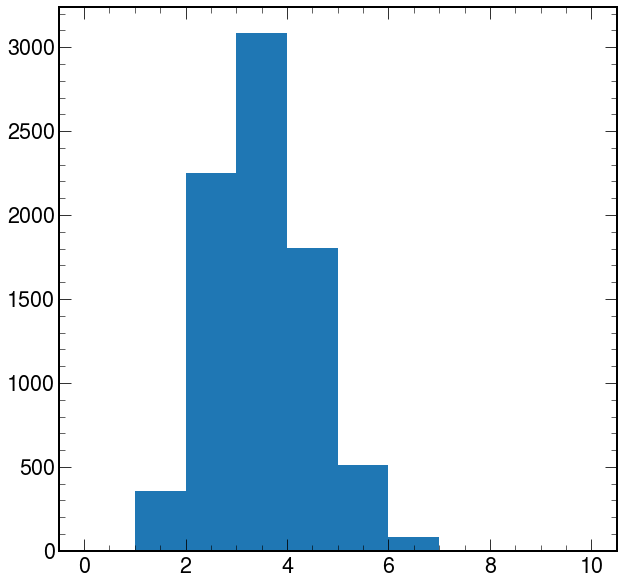

In [49]:
plt.hist(normi21,range=(0,10))

In [117]:
df = pd.DataFrame(data=all_inputs.numpy(),index=rows,columns=input_names)
df

,Jet_eta,Jet_pt,Jet_DeepCSV_flightDistance2dSig,Jet_DeepCSV_flightDistance2dVal,Jet_DeepCSV_flightDistance3dSig,Jet_DeepCSV_flightDistance3dVal,Jet_DeepCSV_trackDecayLenVal_0,Jet_DeepCSV_trackDecayLenVal_1,Jet_DeepCSV_trackDecayLenVal_2,Jet_DeepCSV_trackDecayLenVal_3,...,Jet_DeepCSV_trackSumJetDeltaR,Jet_DeepCSV_trackSumJetEtRatio,Jet_DeepCSV_vertexCategory,Jet_DeepCSV_vertexEnergyRatio,Jet_DeepCSV_vertexJetDeltaR,Jet_DeepCSV_vertexMass,Jet_DeepCSV_jetNSecondaryVertices,Jet_DeepCSV_jetNSelectedTracks,Jet_DeepCSV_jetNTracksEtaRel,Jet_DeepCSV_vertexNTracks
0,1.163818,146.12500,-999.000000,-999.000000,-999.000000,-999.000000,0.003656,0.034180,0.031708,-999.000000,...,0.013176,0.269287,2.0,-999.000000,-999.000000,-999.000000,0.0,3.0,0.0,0.0
1,2.041992,101.81250,3.744141,0.029709,3.664062,0.110413,0.102966,0.043732,0.091614,0.032135,...,0.032104,0.408936,0.0,0.449219,0.103271,4.351562,1.0,9.0,6.0,6.0
2,0.856079,33.78125,-999.000000,-999.000000,-999.000000,-999.000000,0.000978,0.016052,-999.000000,-999.000000,...,0.043579,0.335449,2.0,-999.000000,-999.000000,-999.000000,0.0,2.0,0.0,0.0
3,2.345215,23.75000,-999.000000,-999.000000,-999.000000,-999.000000,0.356445,0.167847,0.029678,-999.000000,...,0.033813,0.800293,2.0,-999.000000,-999.000000,-999.000000,0.0,3.0,0.0,0.0
4,0.204529,172.00000,-999.000000,-999.000000,-999.000000,-999.000000,0.011459,0.065735,0.119446,0.006844,...,0.057648,0.305664,2.0,-999.000000,-999.000000,-999.000000,0.0,7.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,-2.284668,22.00000,-999.000000,-999.000000,-999.000000,-999.000000,0.110962,0.116211,0.062866,-999.000000,...,0.114014,0.644043,2.0,-999.000000,-999.000000,-999.000000,0.0,3.0,0.0,0.0
99996,-1.958740,110.06250,10.476562,0.496338,9.945312,1.950195,0.141602,0.632812,1.294922,0.054810,...,0.024567,0.331055,0.0,0.127686,0.119202,0.708008,1.0,6.0,2.0,2.0
99997,0.616455,71.25000,-999.000000,-999.000000,-999.000000,-999.000000,0.032562,0.041107,-999.000000,-999.000000,...,0.033234,0.191406,2.0,-999.000000,-999.000000,-999.000000,0.0,2.0,0.0,0.0
99998,-1.819336,37.43750,-999.000000,-999.000000,-999.000000,-999.000000,0.114441,0.100586,0.407715,0.081055,...,0.048157,0.630859,2.0,-999.000000,-999.000000,-999.000000,0.0,6.0,0.0,0.0


### Definitions of the functions used for the attacks and plotting

In [86]:
cols = [i for i in range(67)]

In [85]:
rows = [i for i in range(n_jets)]

In [74]:
def apply_noise(magn=None,offset=0,sample=norm_inputs):
    noise = torch.Tensor(np.random.normal(offset,magn,(len(sample),67)))
    xadv = sample + noise
    # exactly like for the reduced fgsm method, the noise should not affect the integer variables or manual defaults
    xadv[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')] = sample[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')]
    xadv[:,input_names.index('Jet_DeepCSV_vertexCategory')] = sample[:,input_names.index('Jet_DeepCSV_vertexCategory')]
    xadv[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')] = sample[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')]
    xadv[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')] = sample[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')]
    xadv[:,input_names.index('Jet_DeepCSV_vertexNTracks')] = sample[:,input_names.index('Jet_DeepCSV_vertexNTracks')]
    
    # the default values were placed at e.g. -999, so something close to -999 - (-999) will end up in a small interval around zero and should not be moved by the attack
    for i in range(67):
        defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) - default_val) < 50   # "floating point error" --> allow some error margin
        if np.sum(defaults) != 0:
            for i in range(67):
                xadv[:,i][defaults] = sample[:,i][defaults]
            break
            
            
    
    for i in [41, 48, 49, 56]:
        defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) + 1.0) < 0.001   # "floating point error" --> allow some error margin
        if np.sum(defaults) != 0:
            for i in [41, 48, 49, 56]:
                xadv[:,i][defaults] = sample[:,i][defaults]
            break
    vars_with_0_defaults = [6, 7, 8, 9, 10, 11]                 # trackDecayLenVal_0 to _5
    vars_with_0_defaults.extend([12, 13, 14, 15, 16, 17])       # trackDeltaR_0 to _5
    vars_with_0_defaults.extend([18, 19, 20, 21])               # trackEtaRel_0 to _3
    vars_with_0_defaults.extend([22, 23, 24, 25, 26, 27])       # trackJetDistVal_0 to _5
    vars_with_0_defaults.extend([29, 30, 31, 32, 33, 34])       # trackPtRatio_0 to _5
    vars_with_0_defaults.extend([35, 36, 37, 38, 39, 40])       # trackPtRel_0 to _5
    for i in vars_with_0_defaults:
        defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu())) < 0.001   # "floating point error" --> allow some error margin
        if np.sum(defaults) != 0:
            for i in vars_with_0_defaults:
                xadv[:,i][defaults] = sample[:,i][defaults]
            break
    
    
    return xadv
      

In [104]:
def fgsm_attack(epsilon=1e-1,sample=norm_inputs,targets=targets,reduced=True,scalers=scalers):
    xadv = sample.clone().detach()
    
    # calculate the gradient of the model w.r.t. the *input* tensor:
    # first we tell torch that x should be included in grad computations
    xadv.requires_grad = True
    
    # then we just do the forward and backwards pass as usual:
    preds = model(xadv)
    loss = criterion(preds, targets.long()).mean()
    model.zero_grad()
    loss.backward()
    
    with torch.no_grad():
        #now we obtain the gradient of the input. It has the same dimensions as the tensor xadv, and it "points" in the direction of increasing loss values.
        dx = torch.sign(xadv.grad.detach())
        
        #so, we take a step in that direction!
        xadv += epsilon*torch.sign(dx)
        
        #remove the impact on selected variables. This is nessecary to avoid problems that occur otherwise in the input shapes.
        if reduced:
            #xadv[:,2] = sample[:,2]     # TagVarCSV_jetNSecondaryVertices
            xadv[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')] = sample[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')]
            #xadv[:,5] = sample[:,5]     # TagVarCSV_vertexCategory
            xadv[:,input_names.index('Jet_DeepCSV_vertexCategory')] = sample[:,input_names.index('Jet_DeepCSV_vertexCategory')]
            #xadv[:,10] = sample[:,10]   # TagVarCSV_jetNSelectedTracks
            xadv[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')] = sample[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')]
            #xadv[:,11] = sample[:,11]   # TagVarCSV_jetNTracksEtaRel
            xadv[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')] = sample[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')]
            #xadv[:,59] = sample[:,59]   # TagVarCSV_vertexNTracks
            xadv[:,input_names.index('Jet_DeepCSV_vertexNTracks')] = sample[:,input_names.index('Jet_DeepCSV_vertexNTracks')]
            #xadv[:,12:][sample[:,12:]==0] = 0   # TagVarCSVTrk_trackJetDistVal and so forth, but I have not set any variable to 0 manually during cleaning
            #xadv[:,input_names.index('Jet_DeepCSV_trackJetDistVal_0'):][sample[:,input_names.index('Jet_DeepCSV_trackJetDistVal_0'):] == 0] = 0
            
            
            # the default values were placed at e.g. -999, so something close to -999 - (-999) will end up in a small interval around zero and should not be moved by the attack
            for i in range(67):
                defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) - default_val) < 50   # "floating point error" --> allow some error margin
                if np.sum(defaults) != 0:
                    for i in range(67):
                        xadv[:,i][defaults] = sample[:,i][defaults]
                    break

            
            
            for i in [41, 48, 49, 56]:
                defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) + 1.0) < 0.001   # "floating point error" --> allow some error margin
                if np.sum(defaults) != 0:
                    for i in [41, 48, 49, 56]:
                        xadv[:,i][defaults] = sample[:,i][defaults]
                    break
            vars_with_0_defaults = [6, 7, 8, 9, 10, 11]                 # trackDecayLenVal_0 to _5
            vars_with_0_defaults.extend([12, 13, 14, 15, 16, 17])       # trackDeltaR_0 to _5
            vars_with_0_defaults.extend([18, 19, 20, 21])               # trackEtaRel_0 to _3
            vars_with_0_defaults.extend([22, 23, 24, 25, 26, 27])       # trackJetDistVal_0 to _5
            vars_with_0_defaults.extend([29, 30, 31, 32, 33, 34])       # trackPtRatio_0 to _5
            vars_with_0_defaults.extend([35, 36, 37, 38, 39, 40])       # trackPtRel_0 to _5
            for i in vars_with_0_defaults:
                defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu())) < 0.001   # "floating point error" --> allow some error margin
                if np.sum(defaults) != 0:
                    for i in vars_with_0_defaults:
                        xadv[:,i][defaults] = sample[:,i][defaults]
                    break
        return xadv.detach()
  

In [98]:
def create_distorted_inputs(attack_mode=None,parameter=0):
    if attack_mode == "noise":
        xadv = apply_noise(parameter)
    else:
        xadv = fgsm_attack(parameter)
        
    xadv_scaled_back = np.zeros([n_jets,67])
    for prop in range(67):
        xadv_scaled_back[:,prop] = scalers[prop].inverse_transform(xadv[:,prop])
        
    xadv_df = pd.DataFrame(xadv_scaled_back, index=rows, columns=input_names)
    corr_xadv = xadv_df.corr('kendall')
    arr_corr_xadv = corr_xadv.to_numpy()
    
    return xadv_df, corr_xadv, arr_corr_xadv

In [118]:
def create_raw_inputs():
    raw=df
    corr_raw = raw.corr('kendall')
    arr_corr_raw = corr_raw.to_numpy()
    
    return raw, corr_raw, arr_corr_raw

In [145]:
def plot_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(arr_corr, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(display_names, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(display_names, rotation=360, fontsize=8)
    
    if attack_mode == None:
        ax.set_title(f'Correlation matrix (Kendall) with raw inputs')
    elif attack_mode == "noise":
        ax.set_title(f'Correlation matrix (Kendall) with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Correlation matrix (Kendall) after FGSM ($\epsilon={parameter}$)')

    #plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/um106329/aisafety/new_march_21/clean_corr_attmode_{attack_mode}_parameter_{parameter}.svg', bbox_inches='tight', facecolor='w', transparent=False)

In [147]:
def plot_abs_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(np.abs(arr_corr), cbar=True, vmin=0, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.Reds)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(display_names, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(display_names, rotation=360, fontsize=8)
    
    if attack_mode == None:
        ax.set_title(f'Absolute correlations (Kendall) with raw inputs')
    elif attack_mode == "noise":
        ax.set_title(f'Absolute correlations (Kendall) with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Absolute correlations (Kendall) after FGSM ($\epsilon={parameter}$)')

    #plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/um106329/aisafety/new_march_21/clean_abs_corr_attmode_{attack_mode}_parameter_{parameter}.svg', bbox_inches='tight', facecolor='w', transparent=False)

In [148]:
def plot_diff_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    diff = arr_corr_raw - arr_corr
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(diff, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(display_names, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(display_names, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Difference between correlation matrix (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Difference between correlation matrix (Kendall) before and after FGSM with $\epsilon={parameter}$')

    #plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/um106329/aisafety/new_march_21/clean_diff_corr_attmode_{attack_mode}_parameter_{parameter}.svg', bbox_inches='tight', facecolor='w', transparent=False)

In [149]:
def plot_abs_diff_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    diff = np.abs(arr_corr_raw) - np.abs(arr_corr)
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(diff, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(display_names, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(display_names, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Difference between absolute correlations (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Difference between absolute correlations (Kendall) before and after FGSM with $\epsilon={parameter}$')

    #plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/um106329/aisafety/new_march_21/clean_abs_diff_corr_attmode_{attack_mode}_parameter_{parameter}.svg', bbox_inches='tight', facecolor='w', transparent=False)

In [150]:
def plot_diff_abs_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    diff = np.abs(arr_corr_raw - arr_corr)
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(diff, cbar=True, vmin=0, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.Reds)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(display_names, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(display_names, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Absolute difference between correlations (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Absolute difference between correlations (Kendall) before and after FGSM with $\epsilon={parameter}$')

    #plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/um106329/aisafety/new_march_21/clean_diff_abs_corr_attmode_{attack_mode}_parameter_{parameter}.svg', bbox_inches='tight', facecolor='w', transparent=False)

In [151]:
def plot_rel_diff_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    rel_diff = (arr_corr_raw - arr_corr) / arr_corr_raw
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(rel_diff, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(display_names, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(display_names, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Rel. difference between correlation matrix (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Rel. difference between correlation matrix (Kendall) before and after FGSM with $\epsilon={parameter}$')

    #plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/um106329/aisafety/new_march_21/clean_rel_diff_corr_attmode_{attack_mode}_parameter_{parameter}.svg', bbox_inches='tight', facecolor='w', transparent=False)

### Generate correlation matrices with undisturbed and disturbed inputs
... create dataframe containing the inputs, create correlations (also as dataframe), create array with correlations

Notice that although the attacks have been performed on scaled inputs ((x-mu)/sigma), the correlations were calculated from the "original" scale (after transforming them back).

A next step might do all these with the scaled inputs during the whole process.

In [119]:
raw, corr_raw, arr_corr_raw = create_raw_inputs()

In [105]:
xadv_df_noise_005, corr_xadv_noise_005, arr_corr_xadv_noise_005 = create_distorted_inputs(attack_mode="noise",parameter=0.05)

xadv_df_noise_01,  corr_xadv_noise_01,  arr_corr_xadv_noise_01  = create_distorted_inputs(attack_mode="noise",parameter=0.1)

xadv_df_noise_02,  corr_xadv_noise_02,  arr_corr_xadv_noise_02  = create_distorted_inputs(attack_mode="noise",parameter=0.2)

In [106]:
xadv_df_fgsm_0005, corr_xadv_fgsm_0005, arr_corr_xadv_fgsm_0005 = create_distorted_inputs(attack_mode="fgsm",parameter=0.005)

xadv_df_fgsm_001,  corr_xadv_fgsm_001,  arr_corr_xadv_fgsm_001  = create_distorted_inputs(attack_mode="fgsm",parameter=0.01)

xadv_df_fgsm_002,  corr_xadv_fgsm_002,  arr_corr_xadv_fgsm_002  = create_distorted_inputs(attack_mode="fgsm",parameter=0.02)

... and plot the correlations, their differences compared to raw and the relative differences

## Correlations
White: uncorrelated  
Red: positive correlation  
Blue: negative correlation

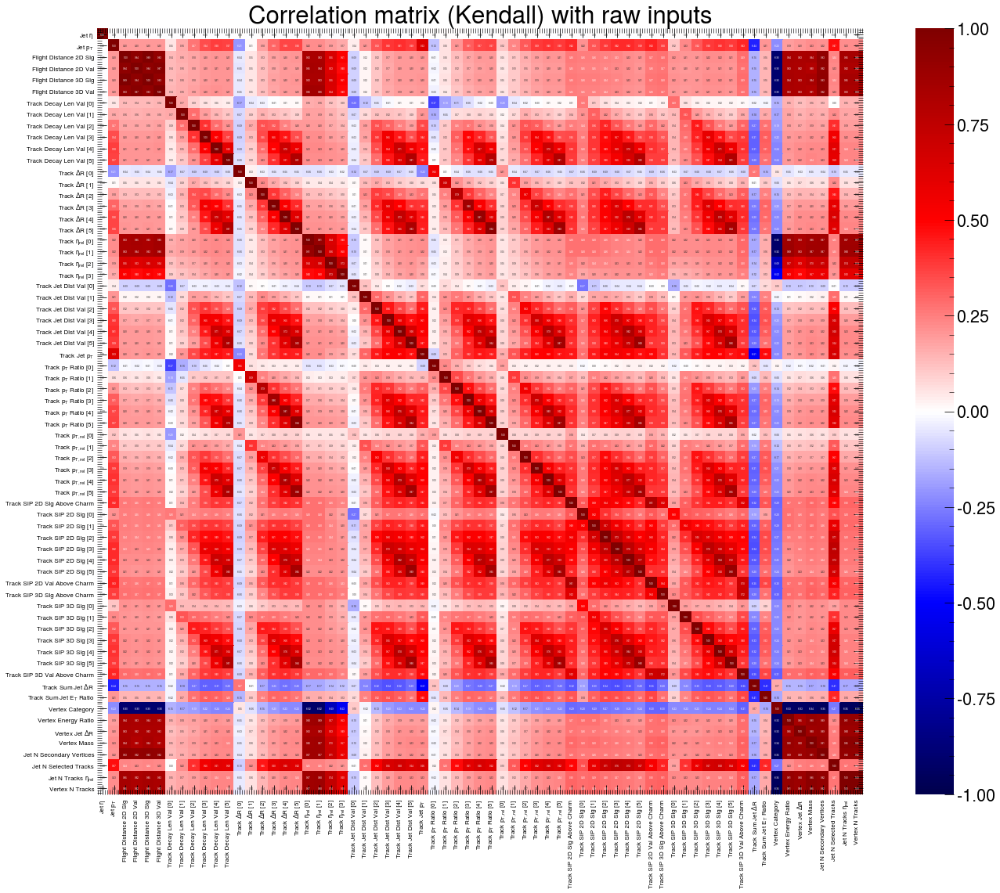

In [146]:
plot_corr(attack_mode=None, parameter=None, corr=corr_raw, arr_corr=arr_corr_raw)

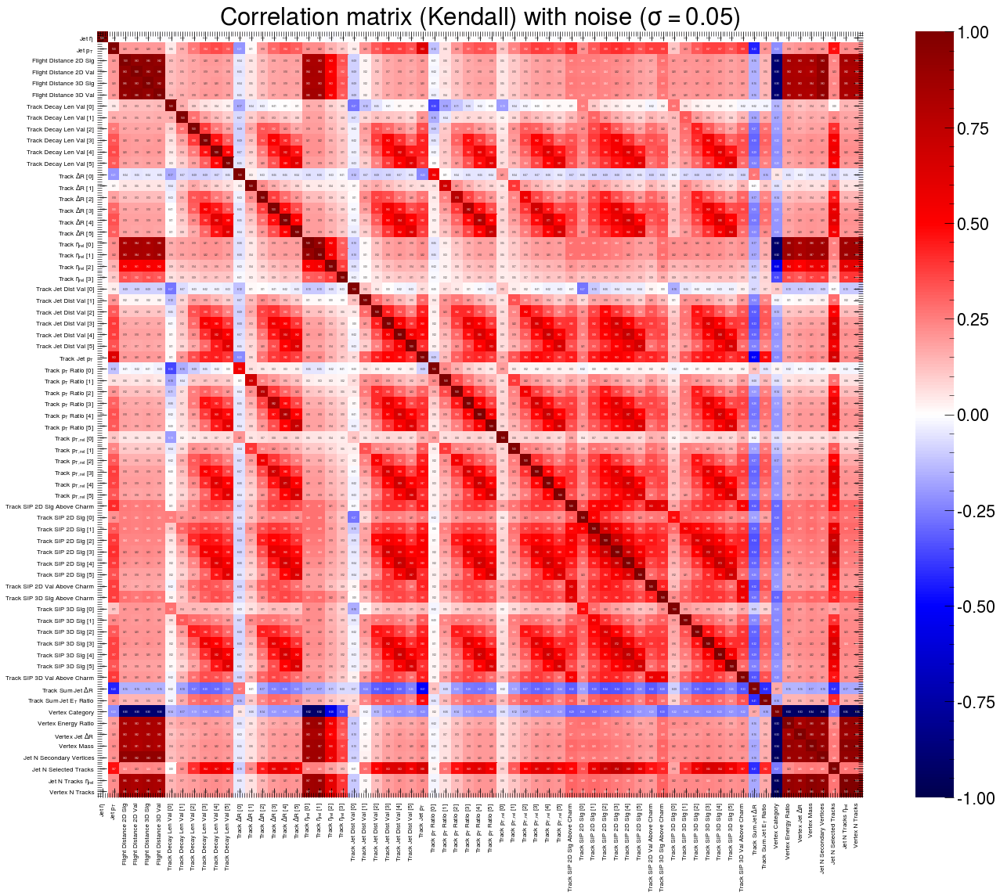

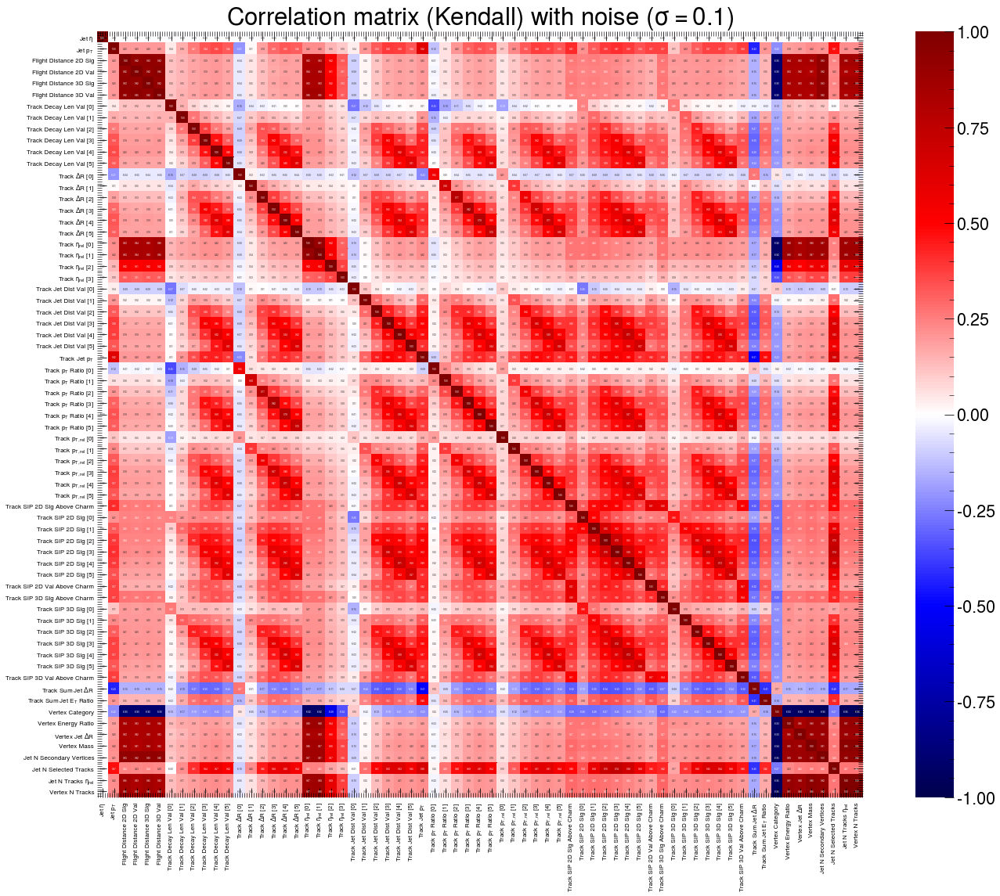

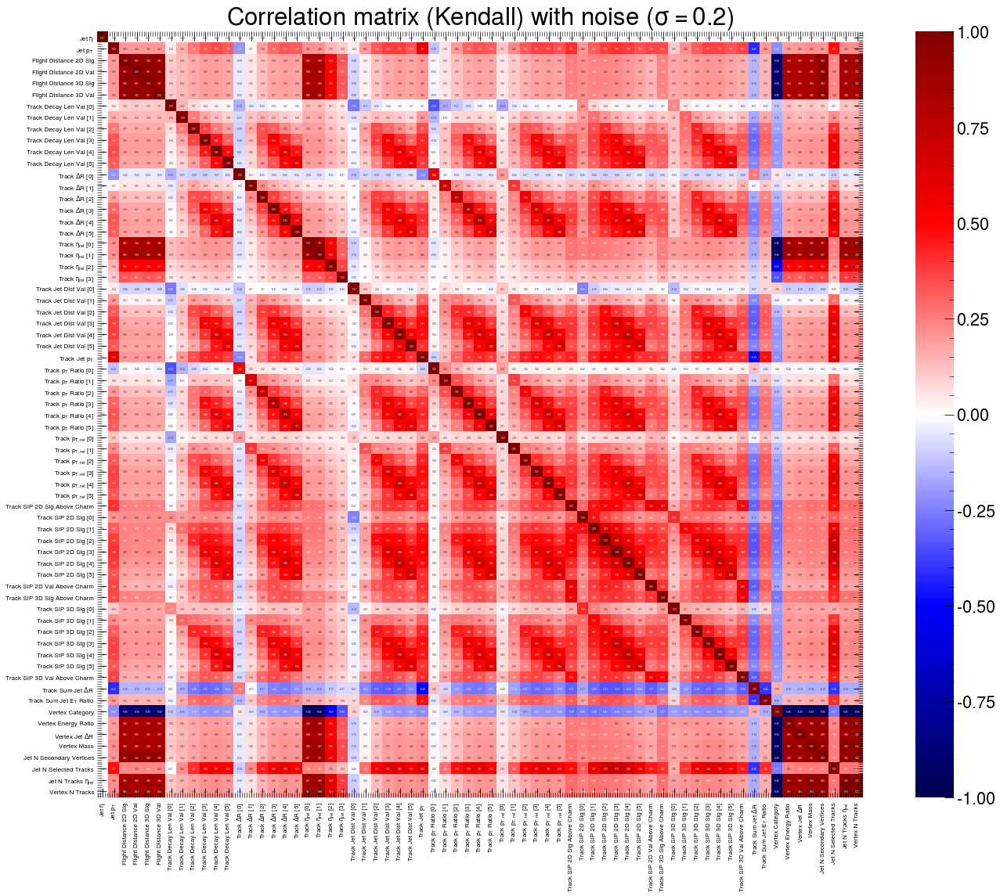

In [152]:
plot_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_corr(attack_mode="noise", parameter=0.1,  corr=corr_xadv_noise_01,  arr_corr=arr_corr_xadv_noise_01)
plot_corr(attack_mode="noise", parameter=0.2,  corr=corr_xadv_noise_02,  arr_corr=arr_corr_xadv_noise_02)

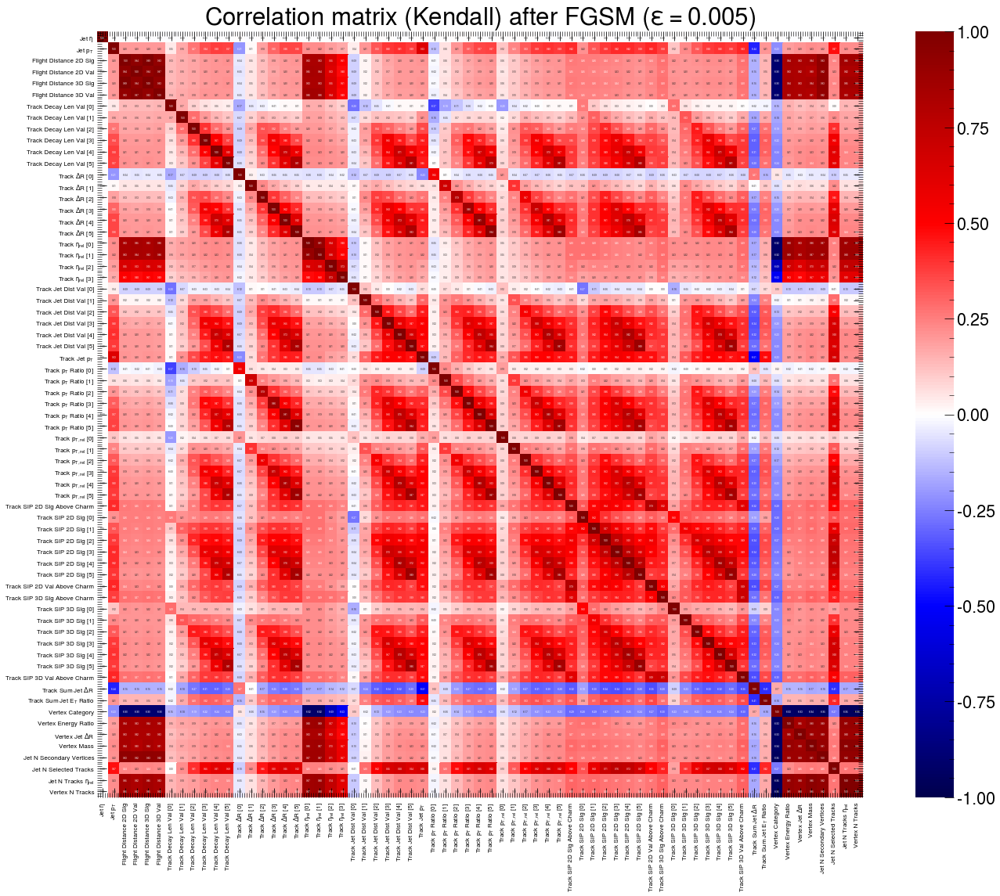

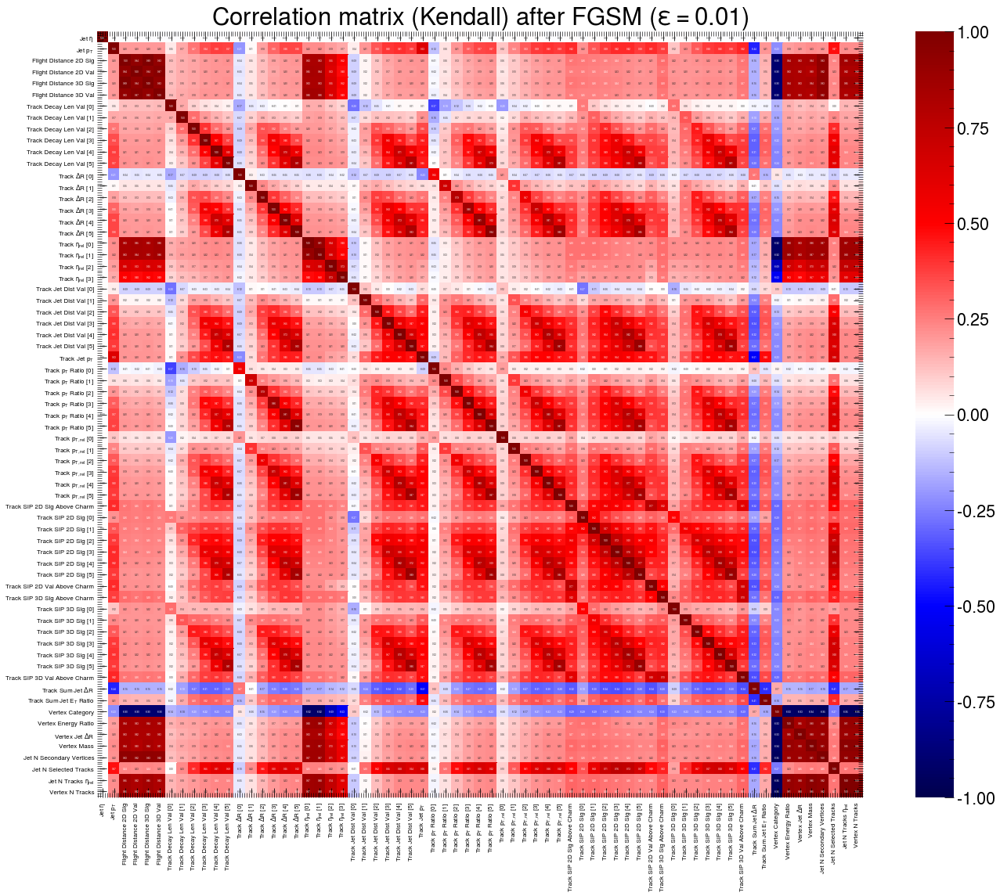

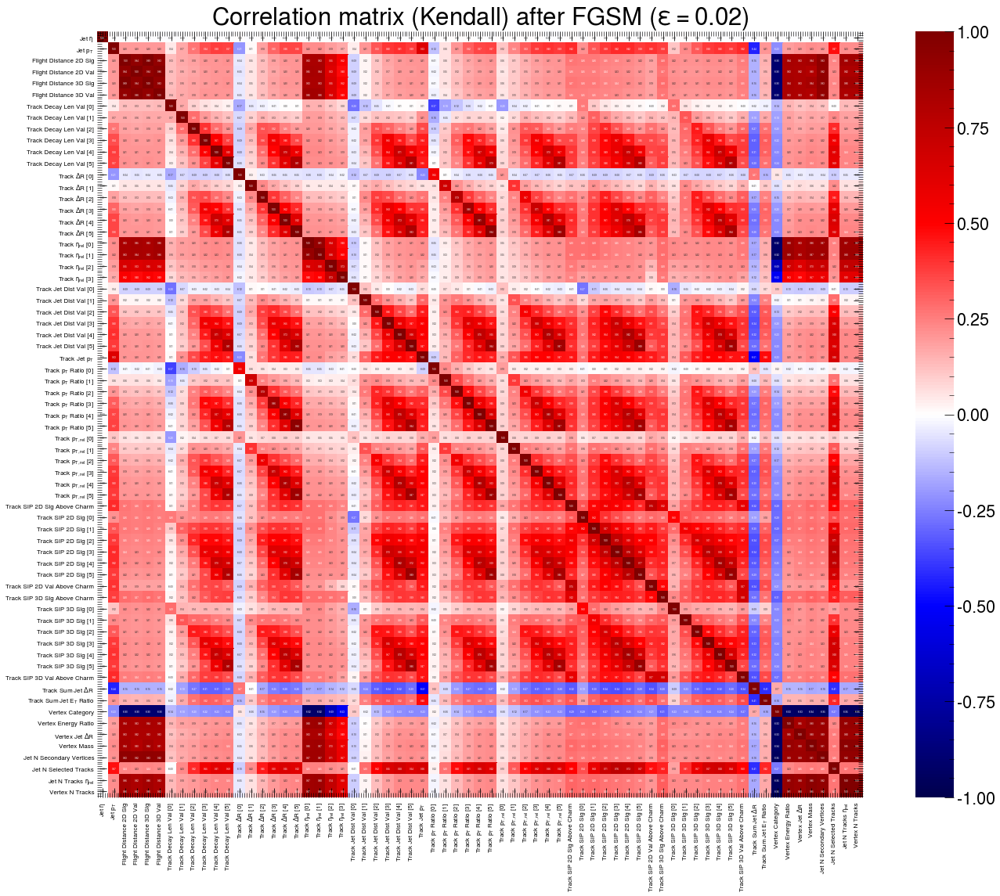

In [153]:
plot_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Differences between correlations
### Taken as: before - after
White: no change  
Red: before the attack, the absolute correlation was higher  
Blue: after the attack, the absolute correlation is higher

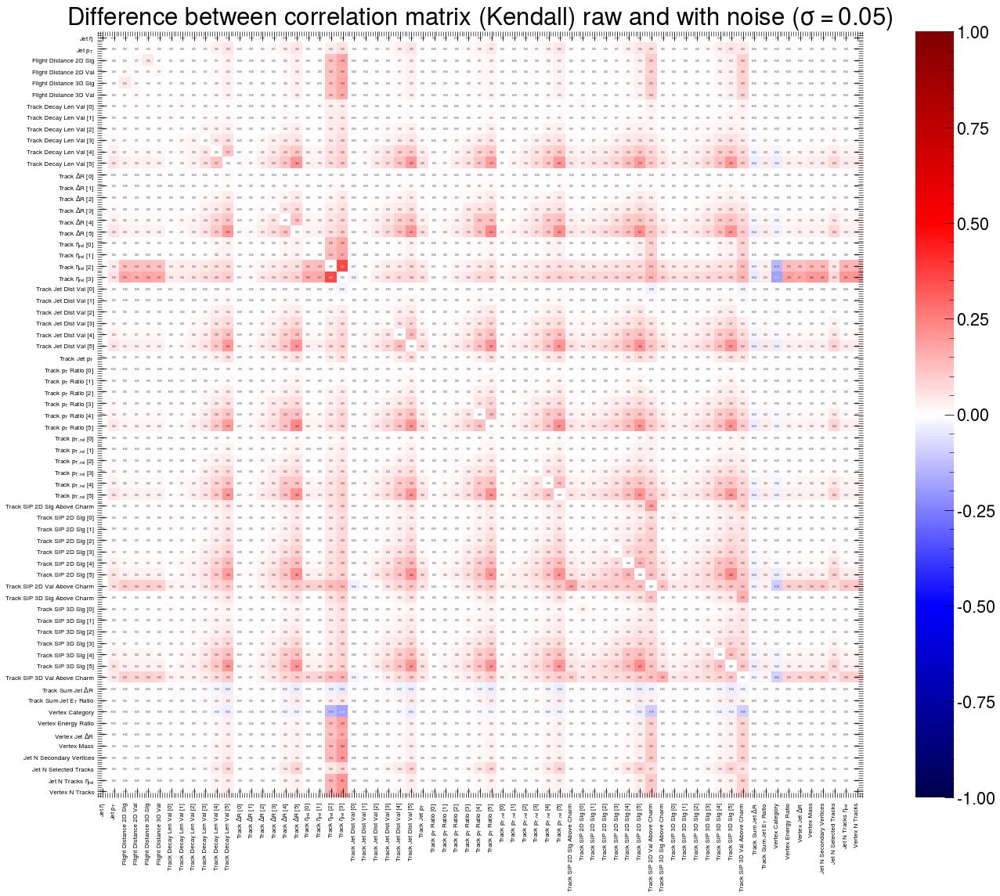

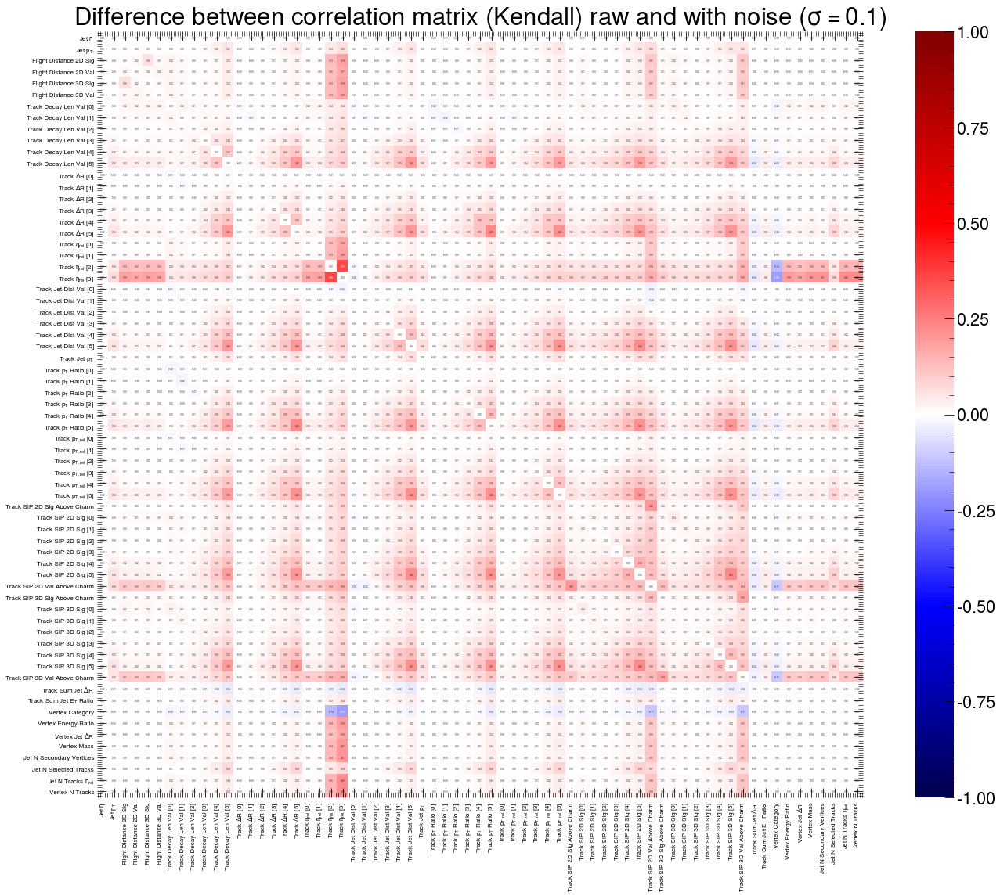

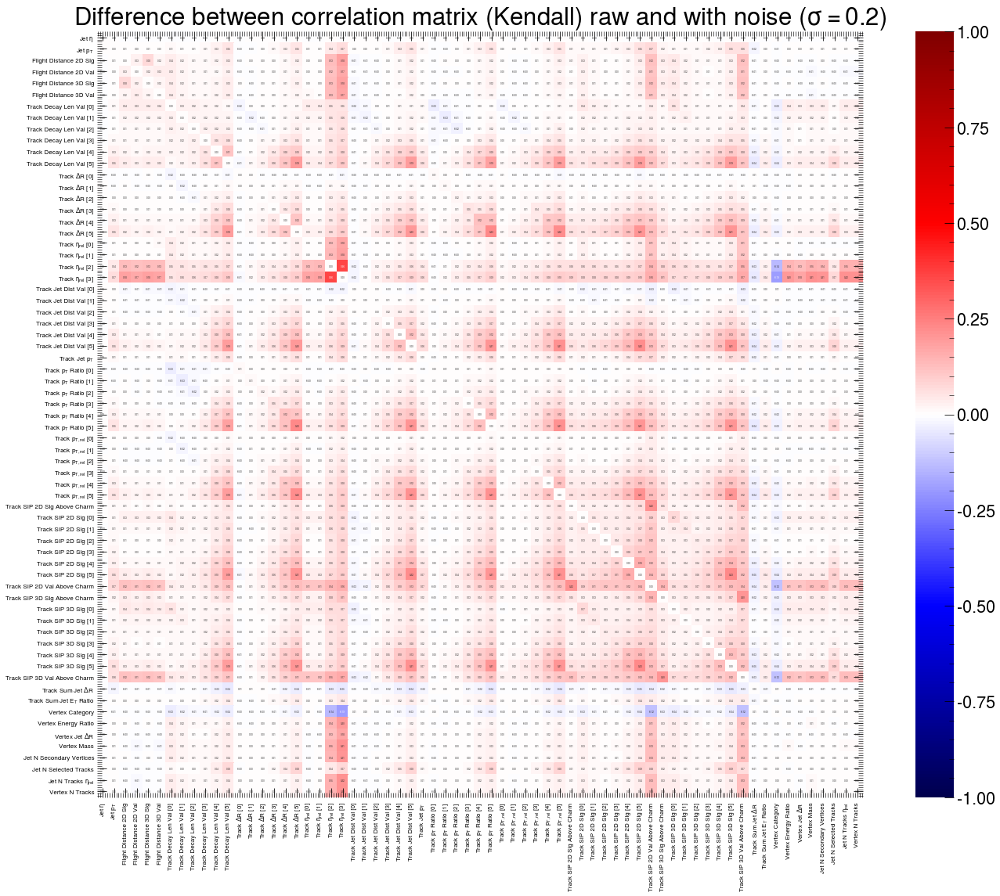

In [154]:
plot_diff_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_diff_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_diff_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

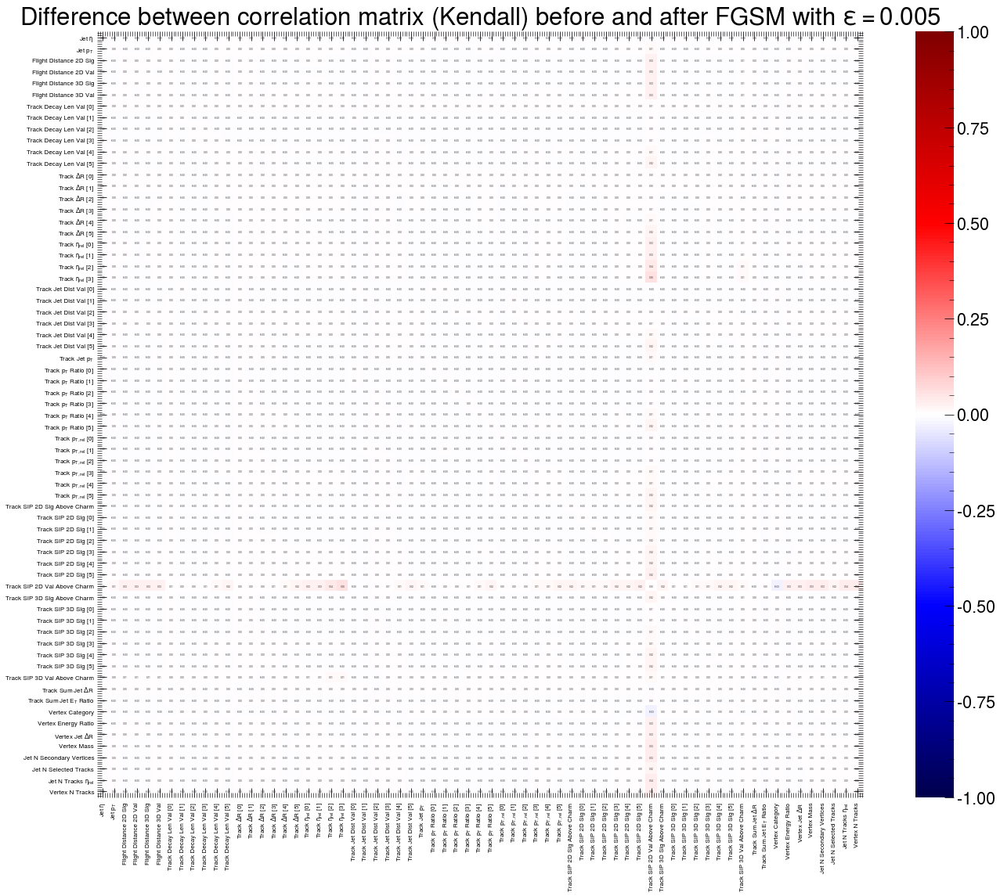

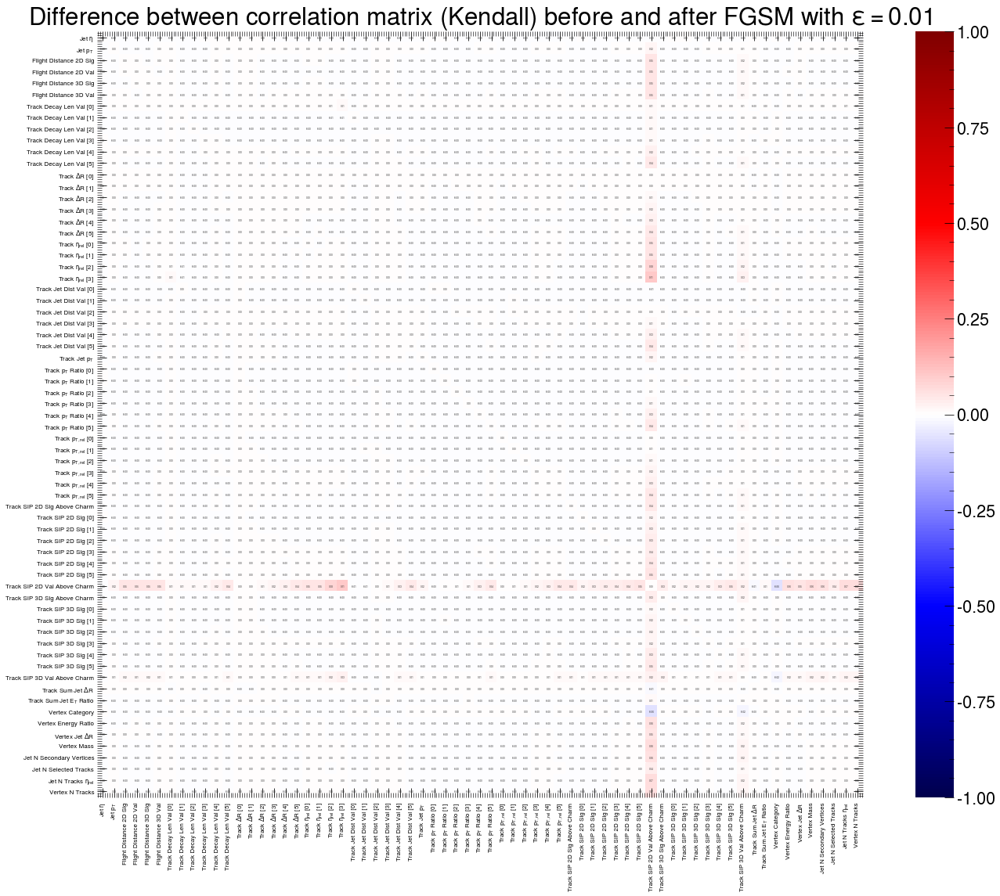

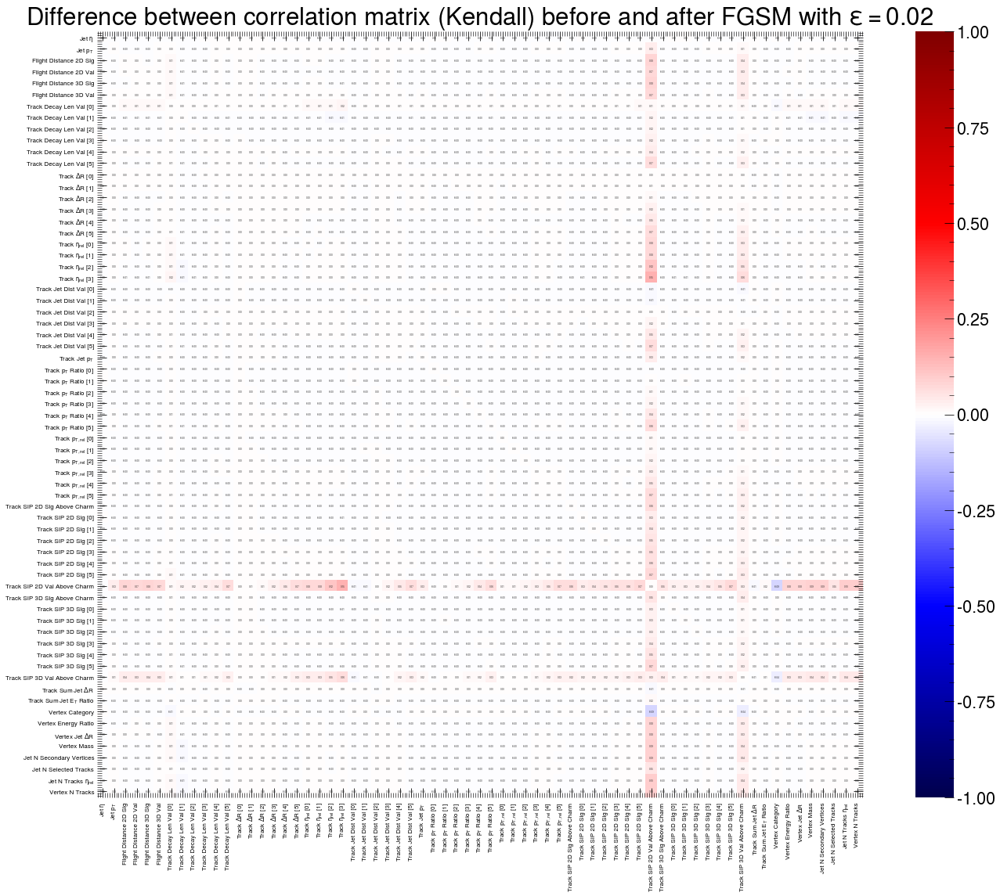

In [155]:
plot_diff_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_diff_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_diff_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Relative differences between correlations
### Taken as: (before - after) / before
White: no change  
Red: before the attack, the absolute correlation was higher  
Blue: after the attack, the absolute correlation is higher

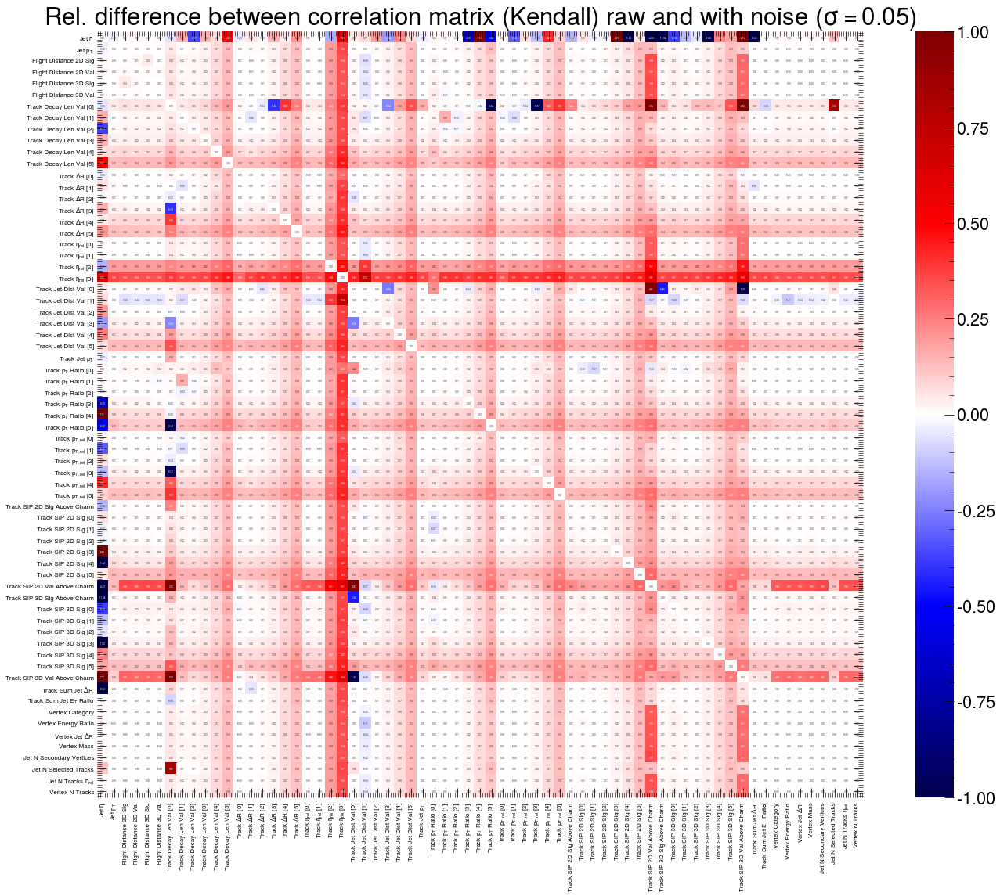

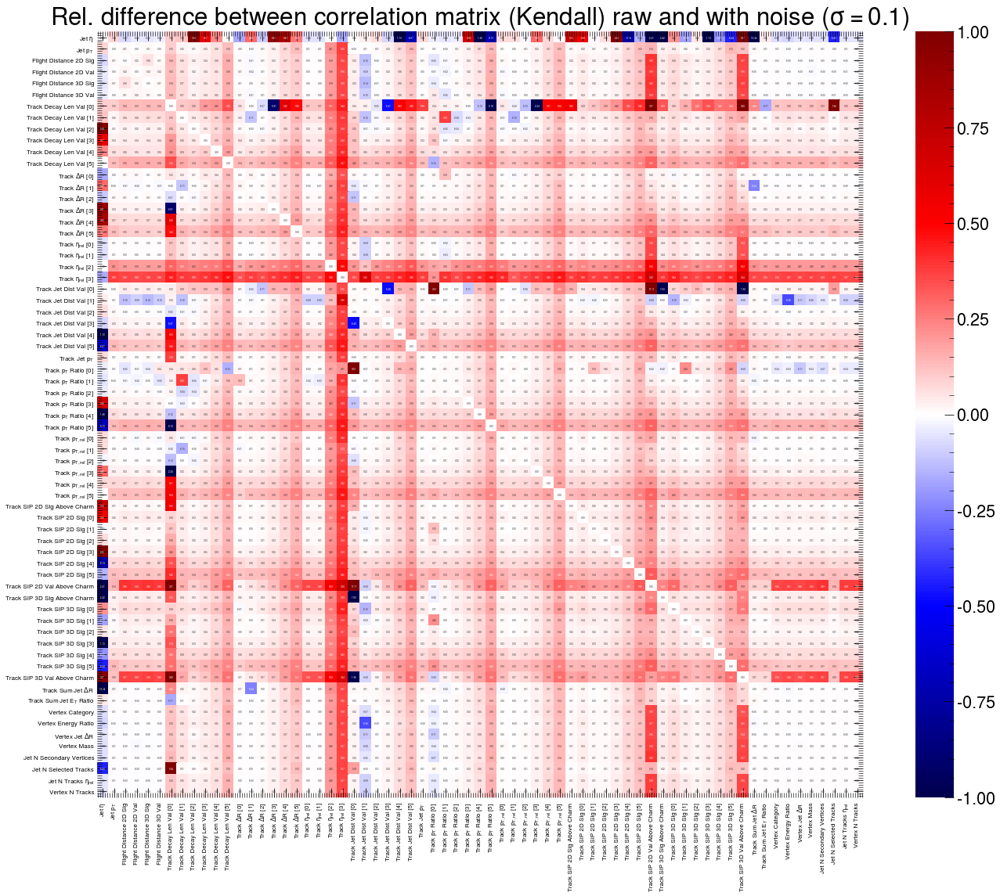

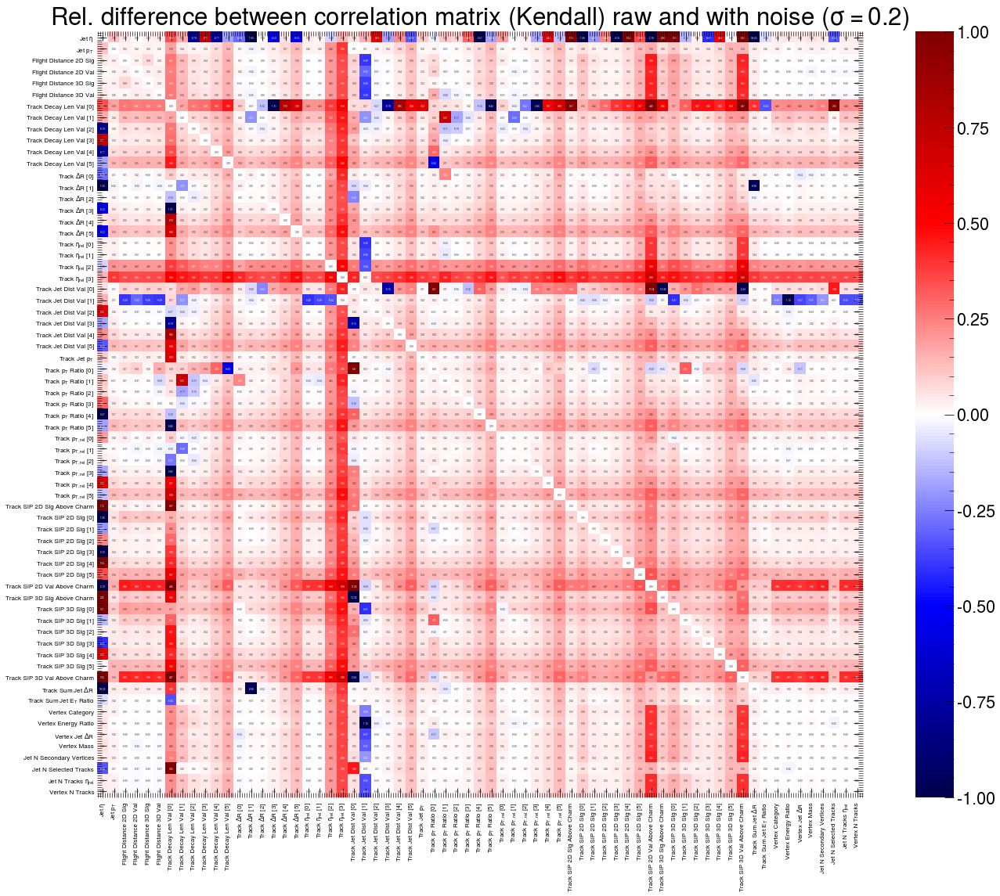

In [156]:
plot_rel_diff_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_rel_diff_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_rel_diff_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

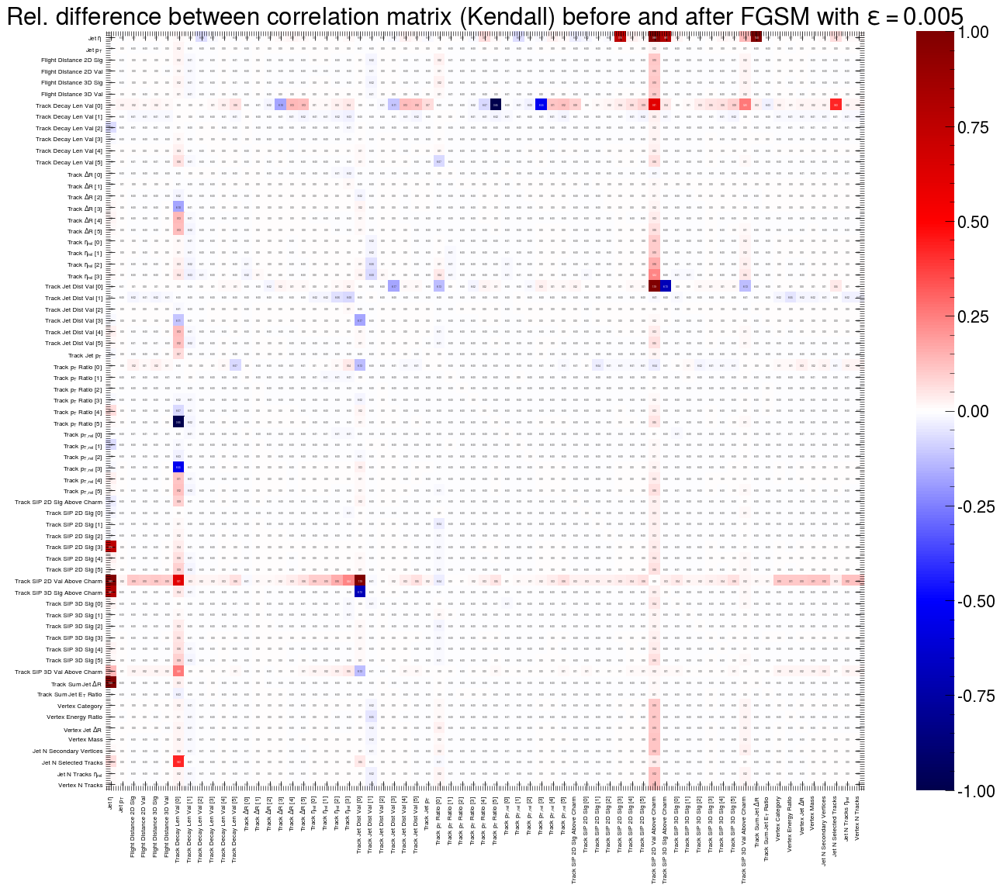

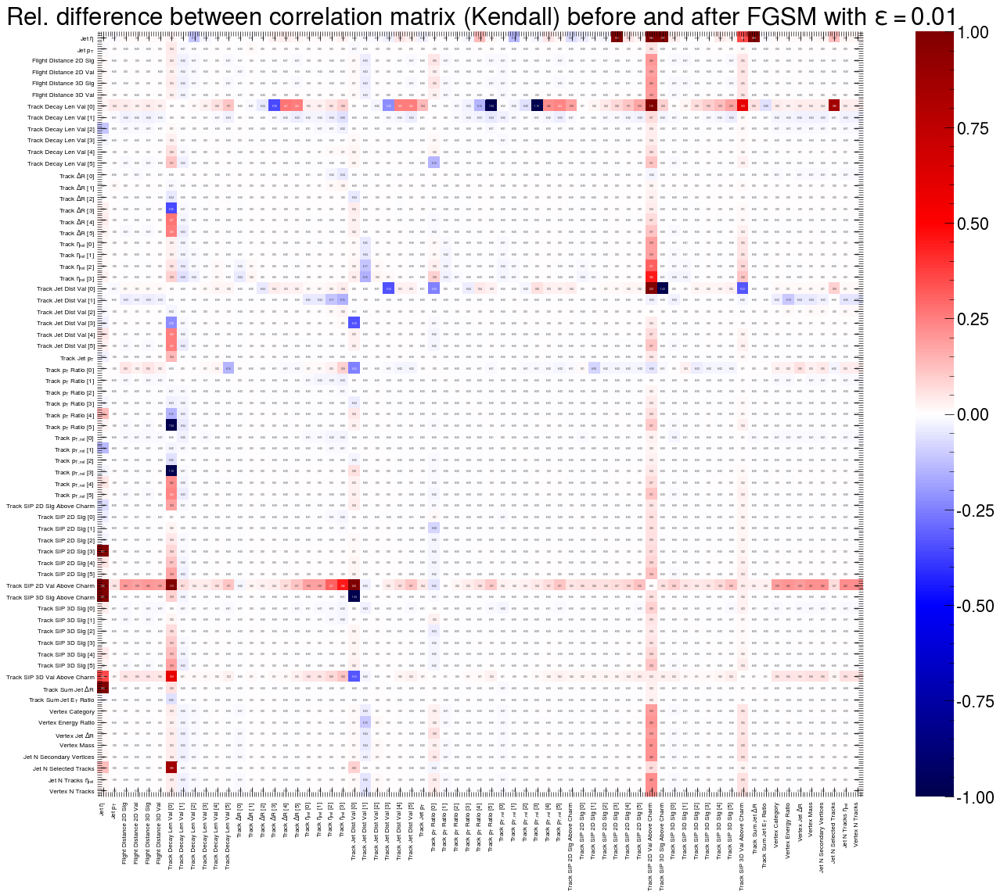

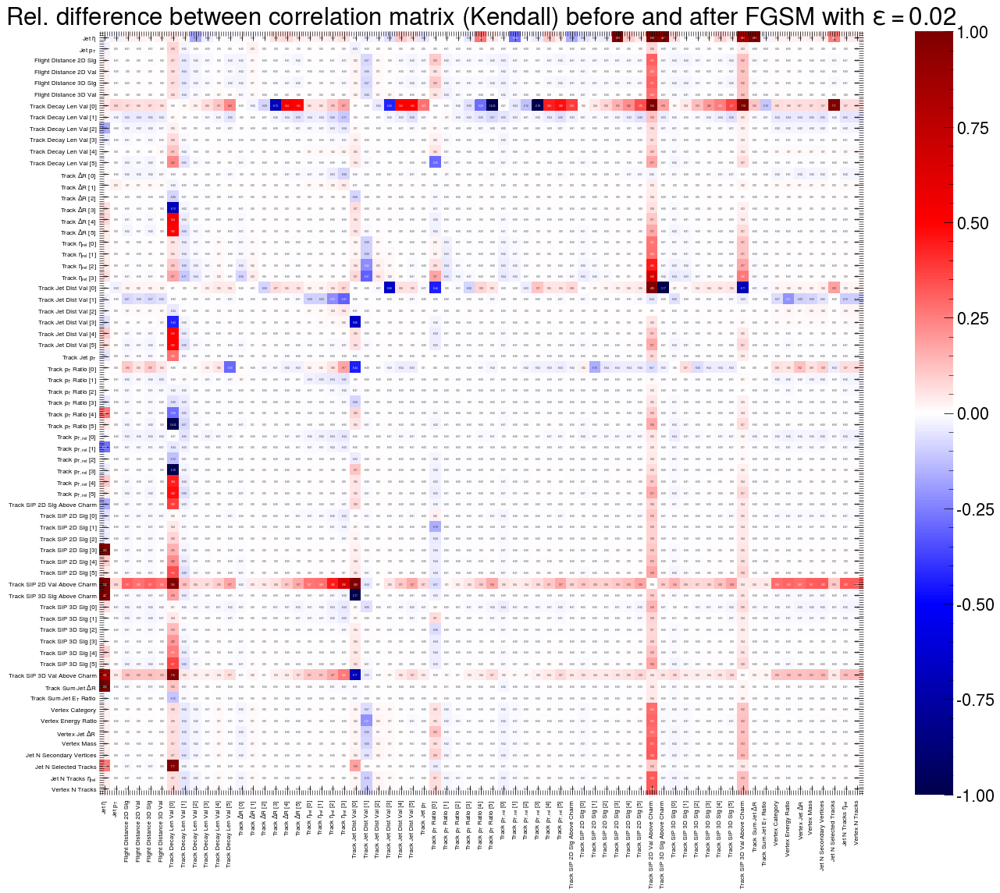

In [157]:
plot_rel_diff_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_rel_diff_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_rel_diff_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Absolute correlations
Red: high absolute correlation (can be either positive or negative)  
White: uncorrelated

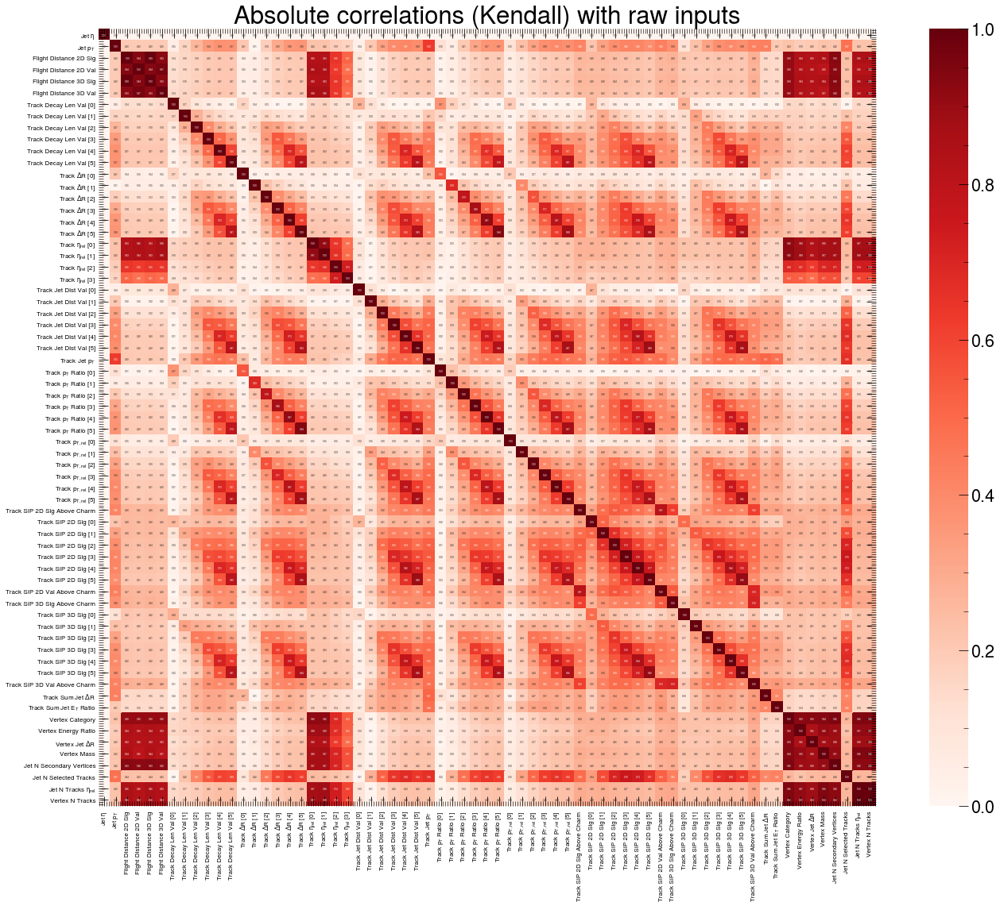

In [158]:
plot_abs_corr(attack_mode=None, parameter=None, corr=corr_raw, arr_corr=arr_corr_raw)

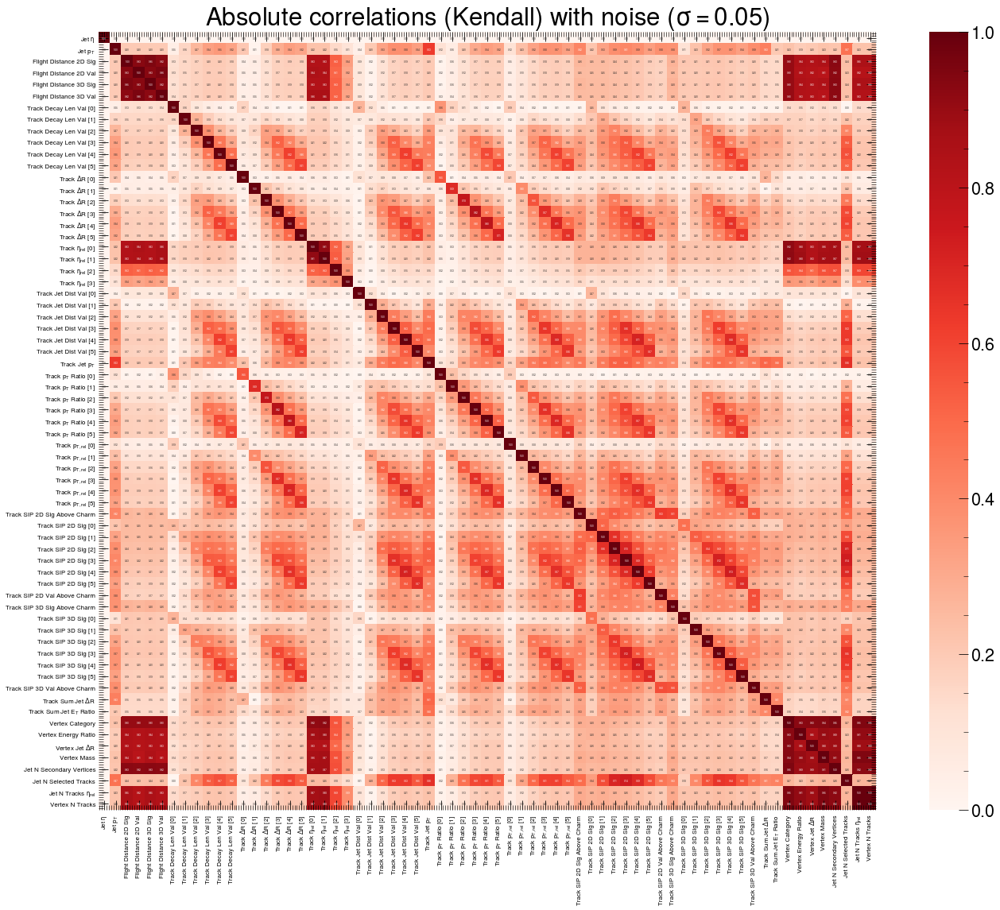

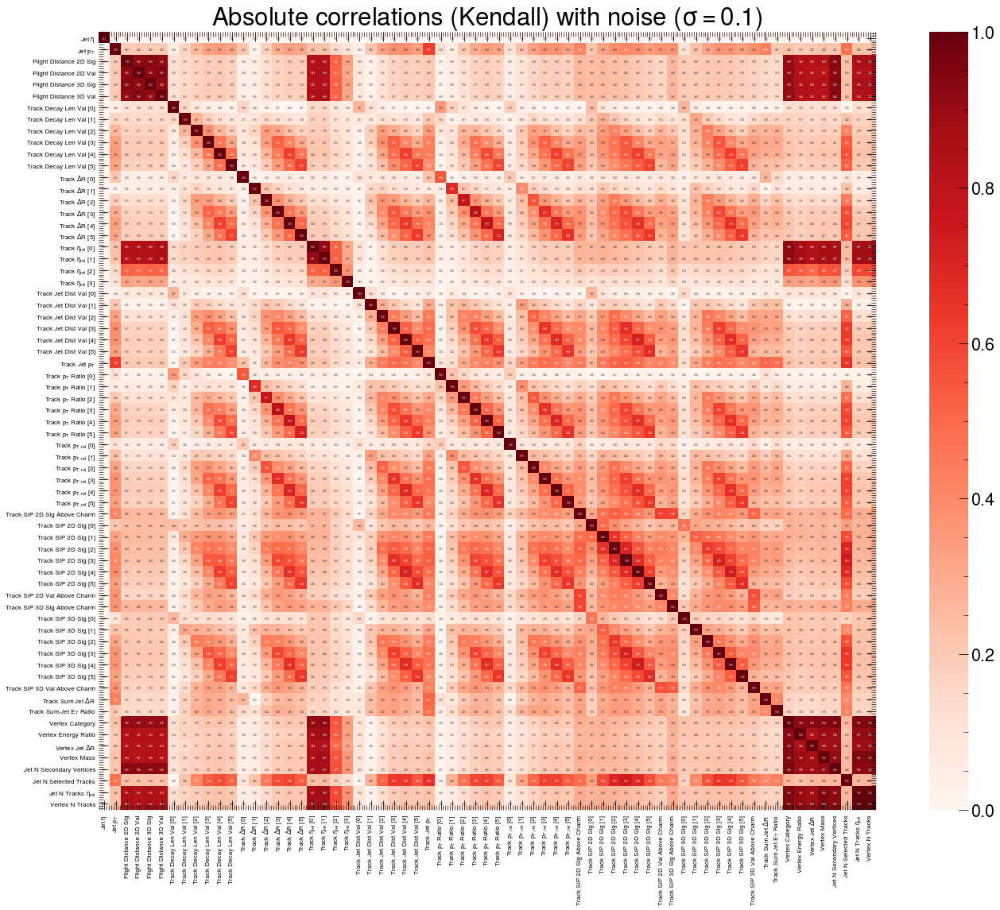

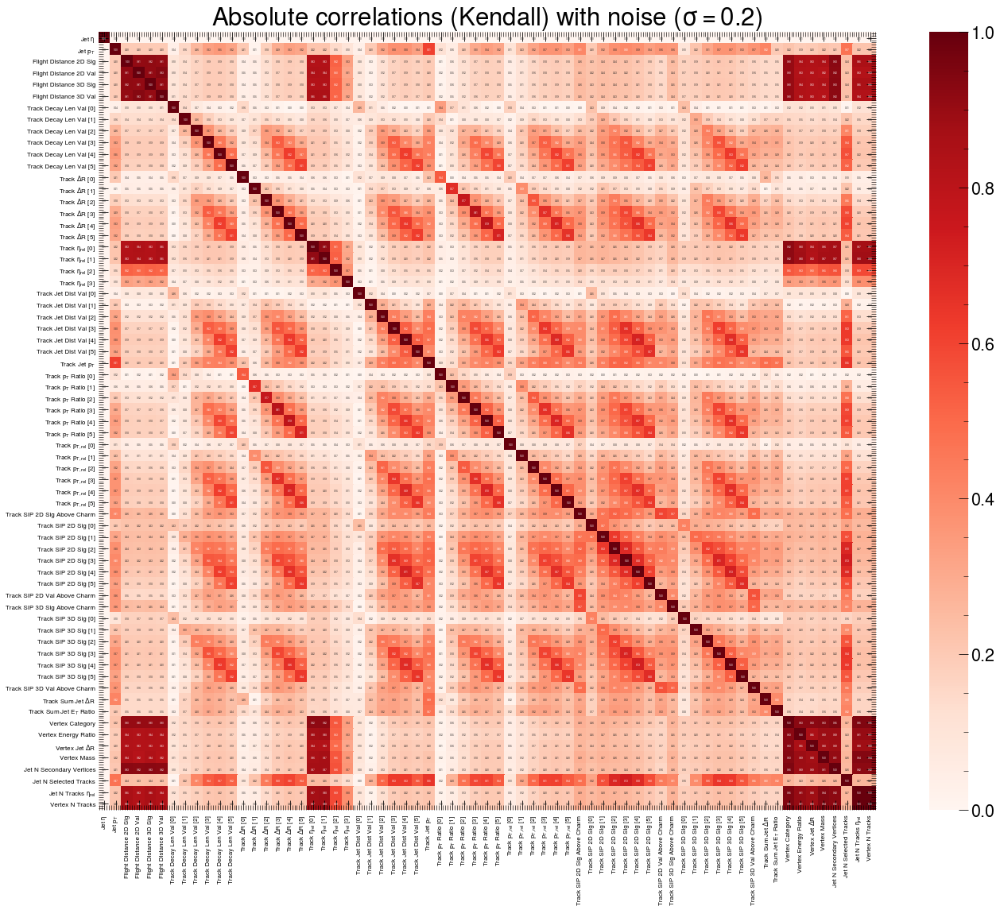

In [159]:
plot_abs_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_abs_corr(attack_mode="noise", parameter=0.1,  corr=corr_xadv_noise_01,  arr_corr=arr_corr_xadv_noise_01)
plot_abs_corr(attack_mode="noise", parameter=0.2,  corr=corr_xadv_noise_02,  arr_corr=arr_corr_xadv_noise_02)

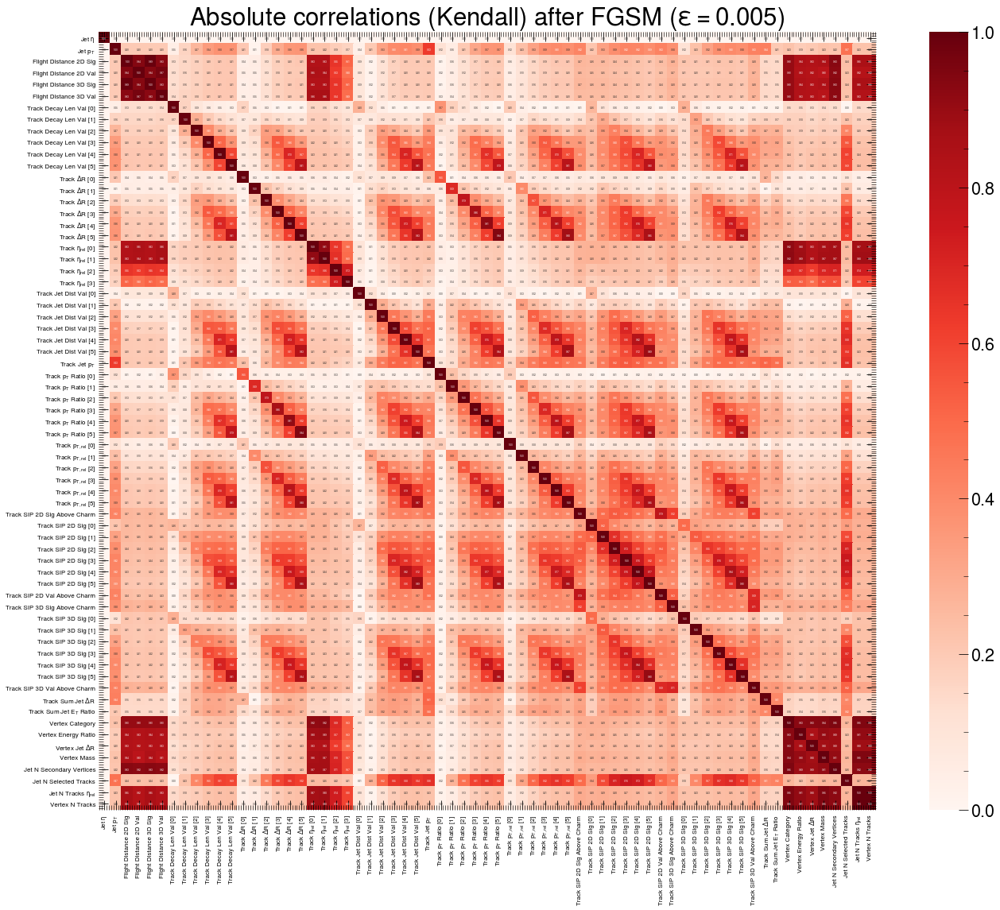

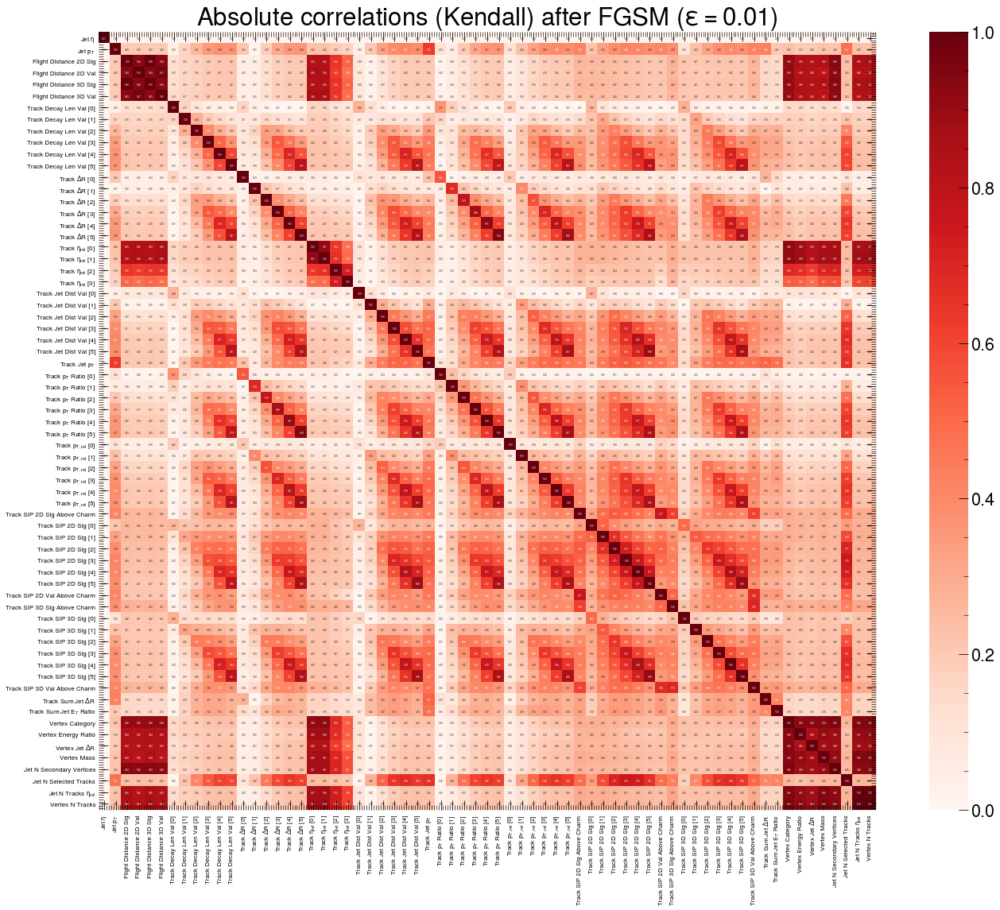

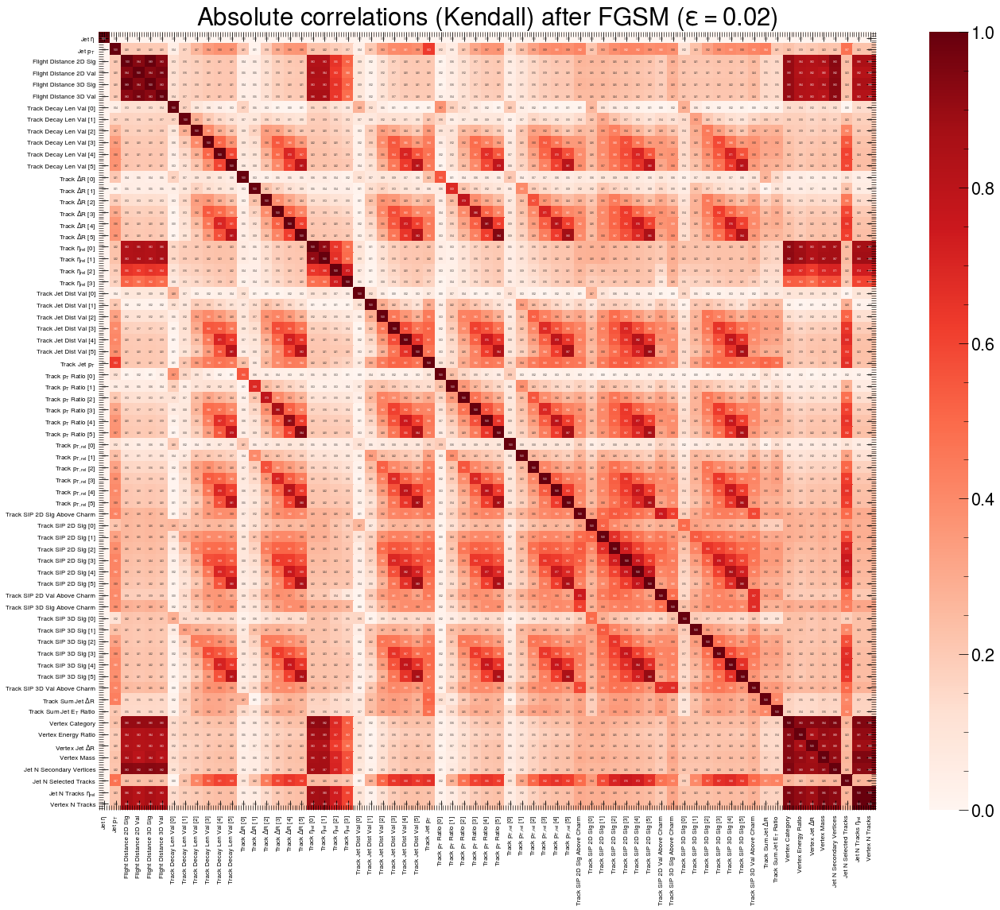

In [160]:
plot_abs_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_abs_corr(attack_mode="fgsm", parameter=0.01,  corr=corr_xadv_fgsm_001,  arr_corr=arr_corr_xadv_fgsm_001)
plot_abs_corr(attack_mode="fgsm", parameter=0.02,  corr=corr_xadv_fgsm_002,  arr_corr=arr_corr_xadv_fgsm_002)

## Differences between absolute correlations
### Taken as: abs(before) - abs(after)
White: no change  
Red: before the attack, the absolute correlation was higher  
Blue: after the attack, the absolute correlation is higher

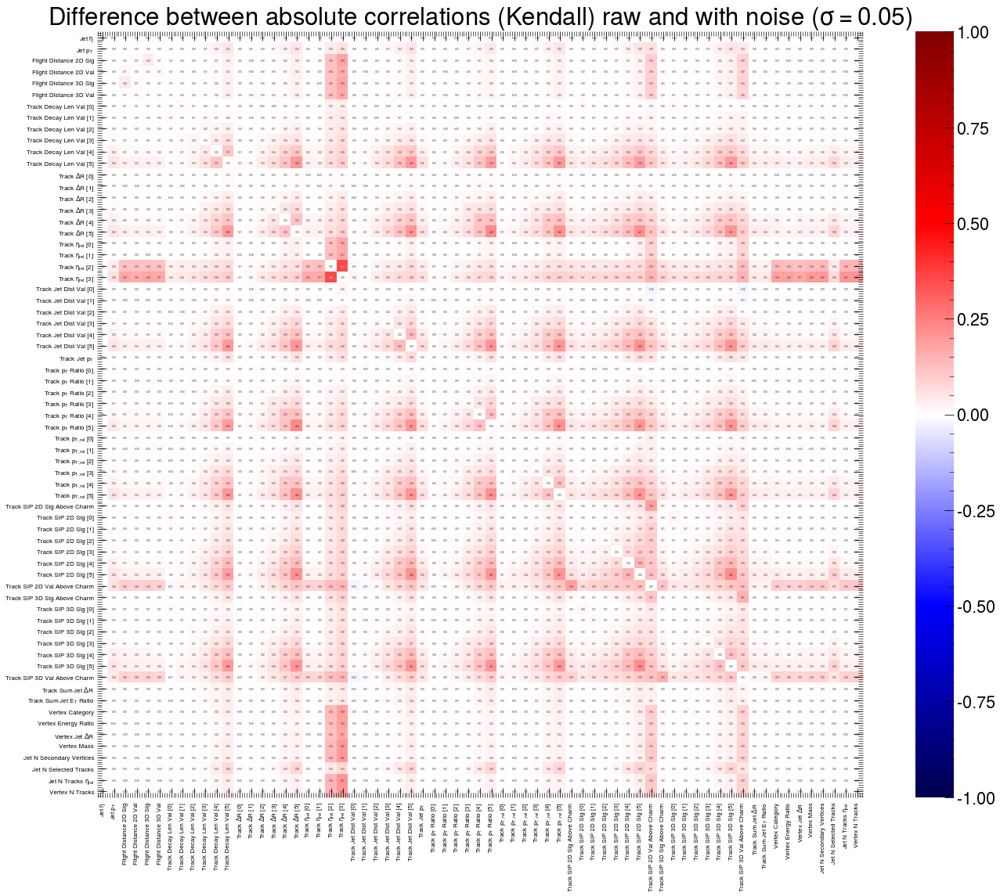

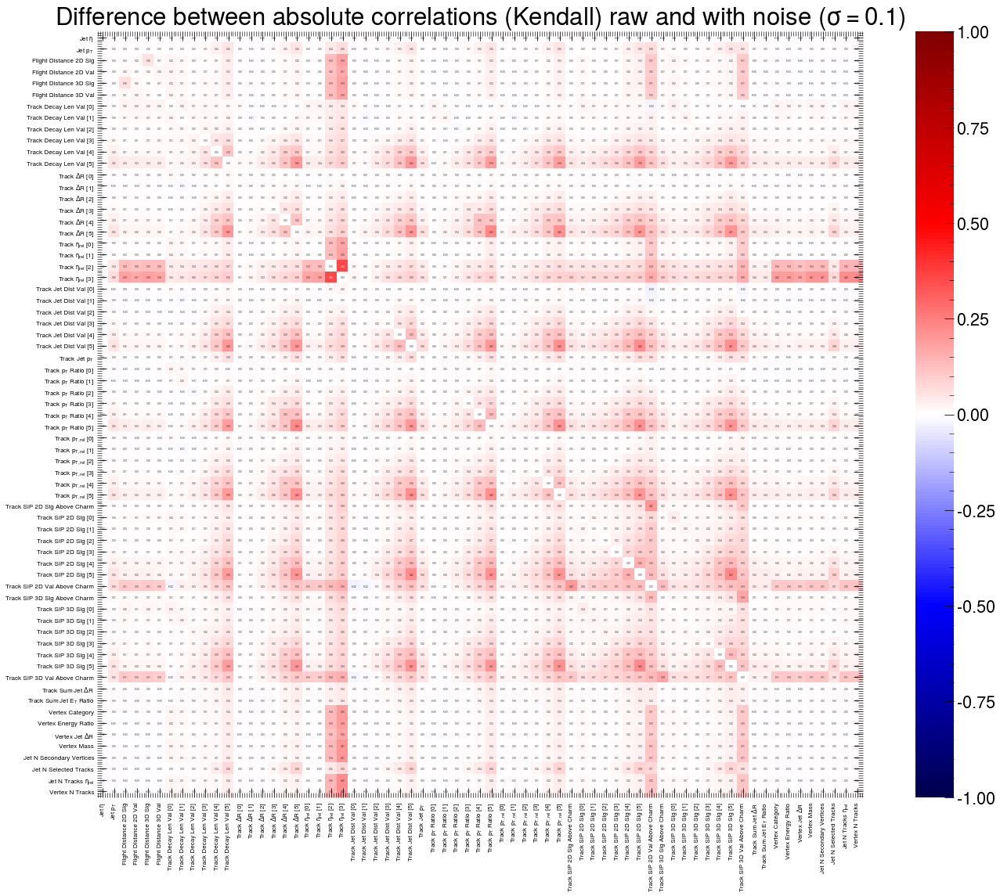

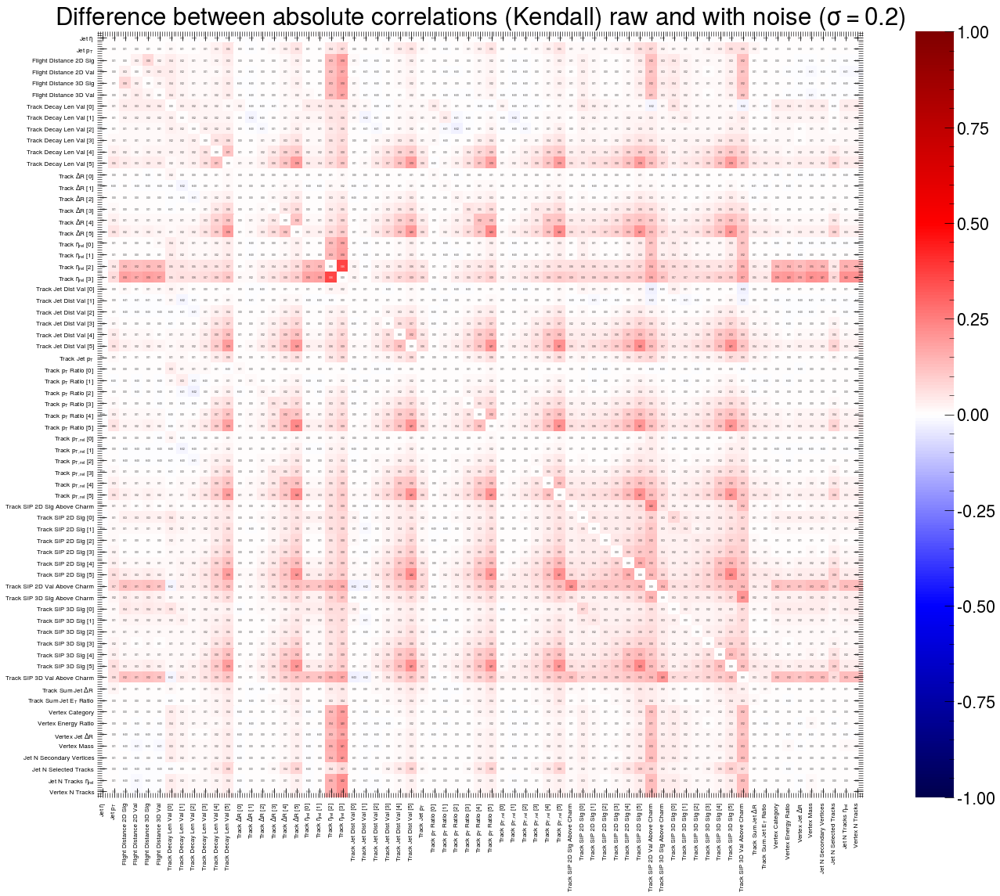

In [161]:
plot_abs_diff_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_abs_diff_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_abs_diff_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

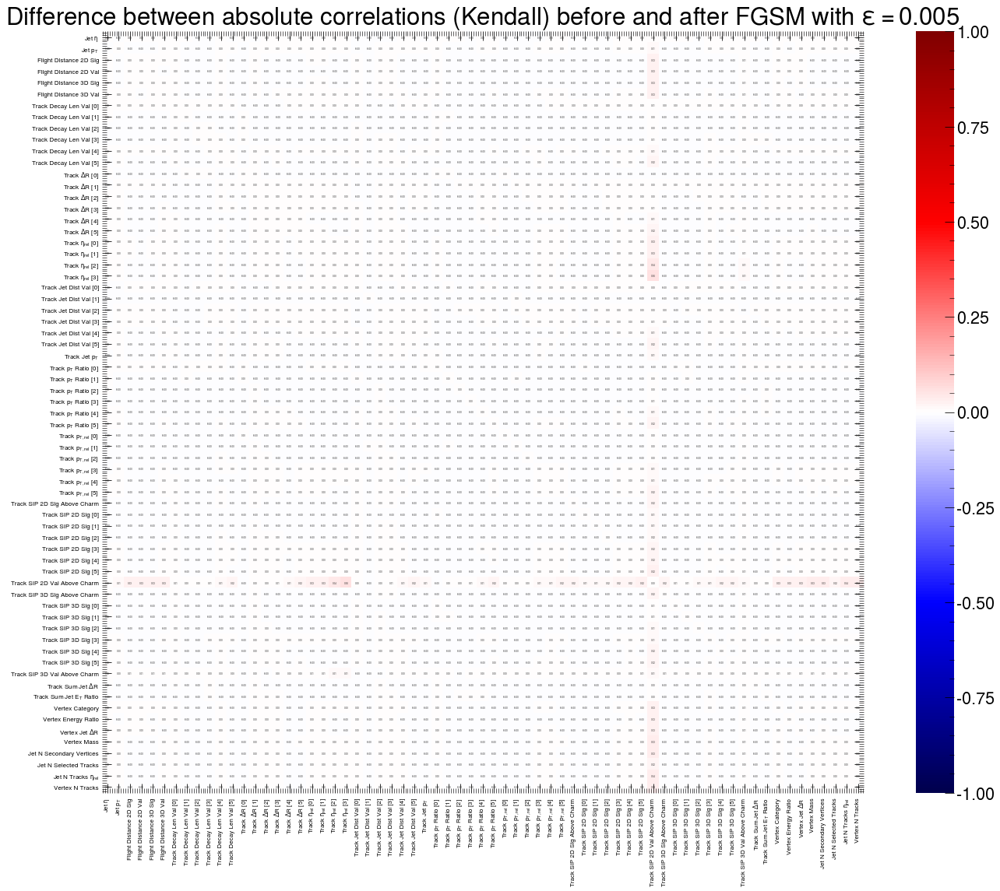

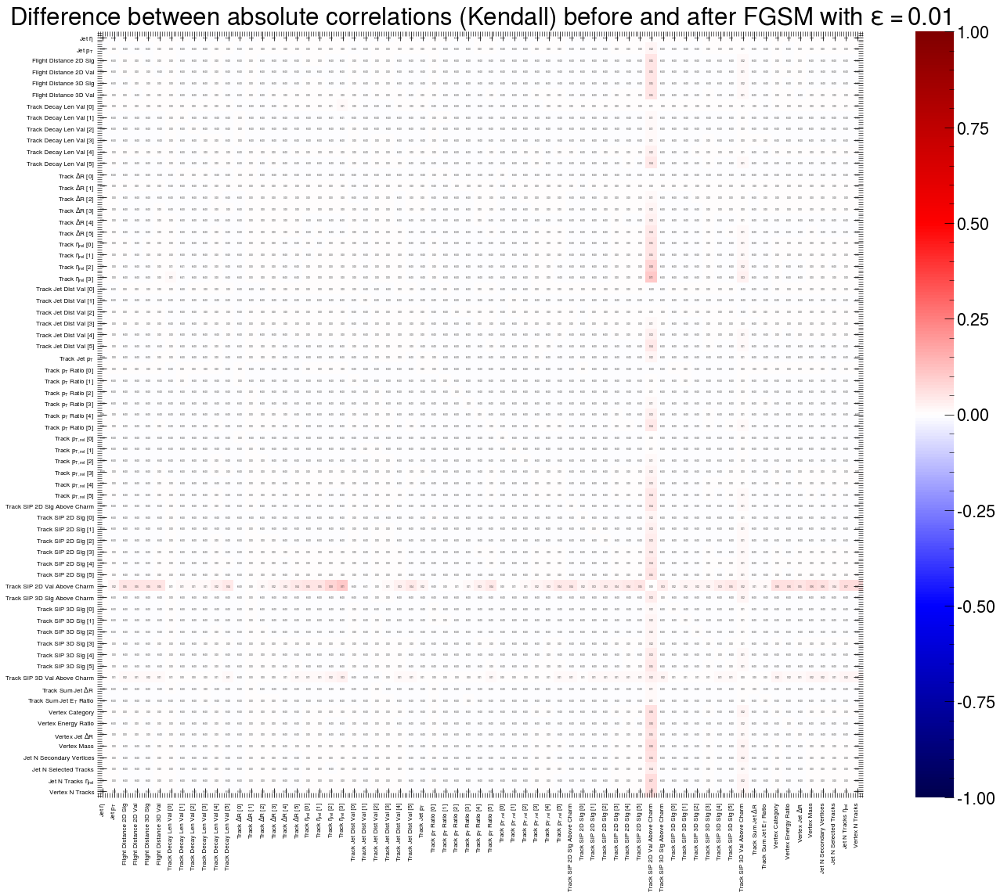

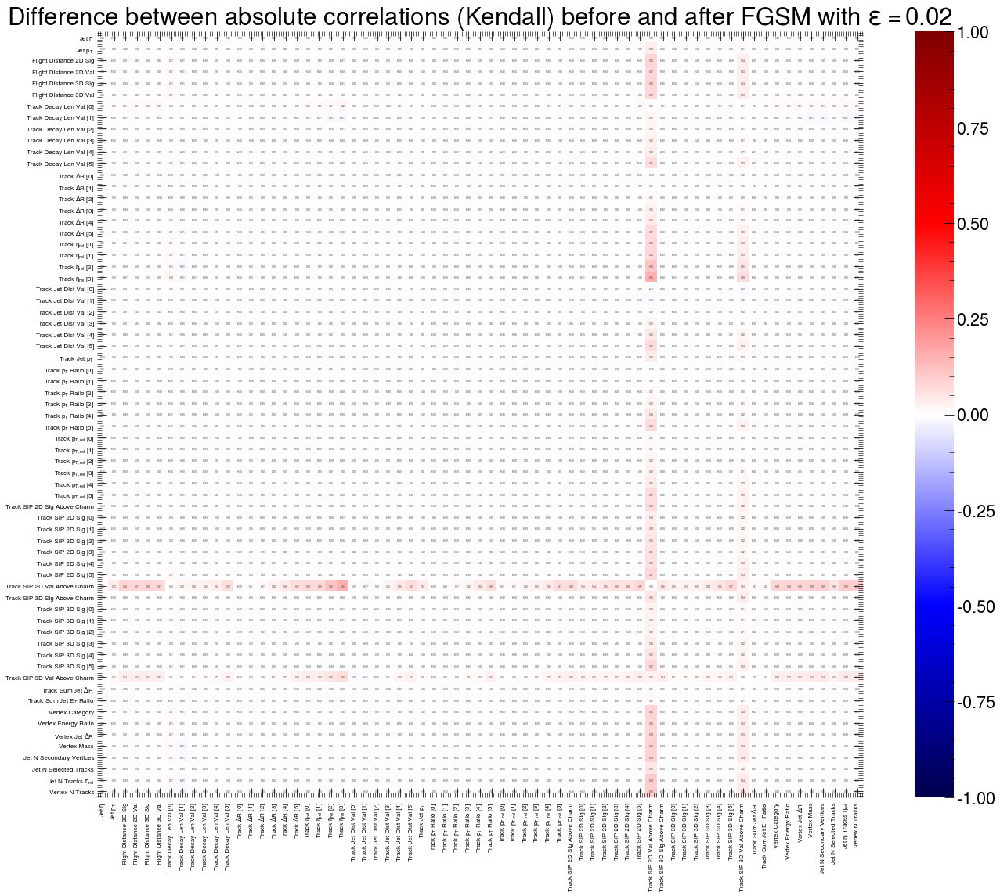

In [162]:
plot_abs_diff_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_abs_diff_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_abs_diff_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Absolute differences between correlations
### Taken as: abs(before - after)
White: no change  
Red: large impact of attack on correlations

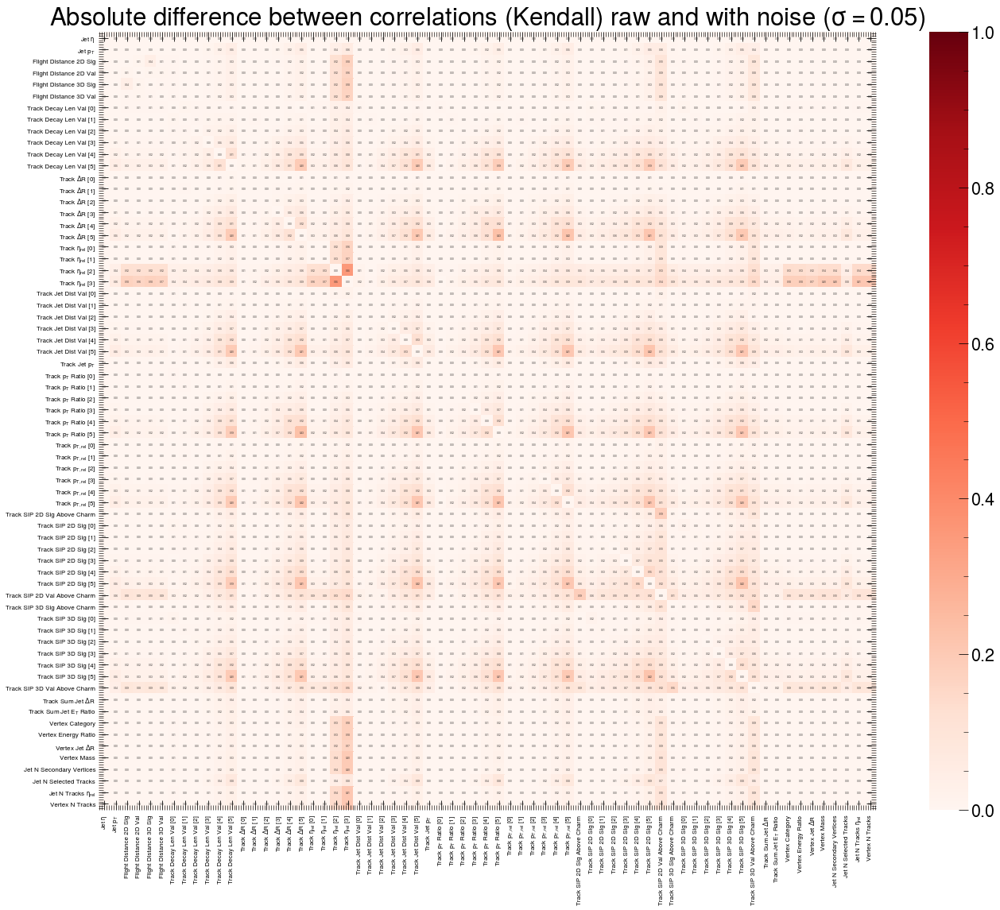

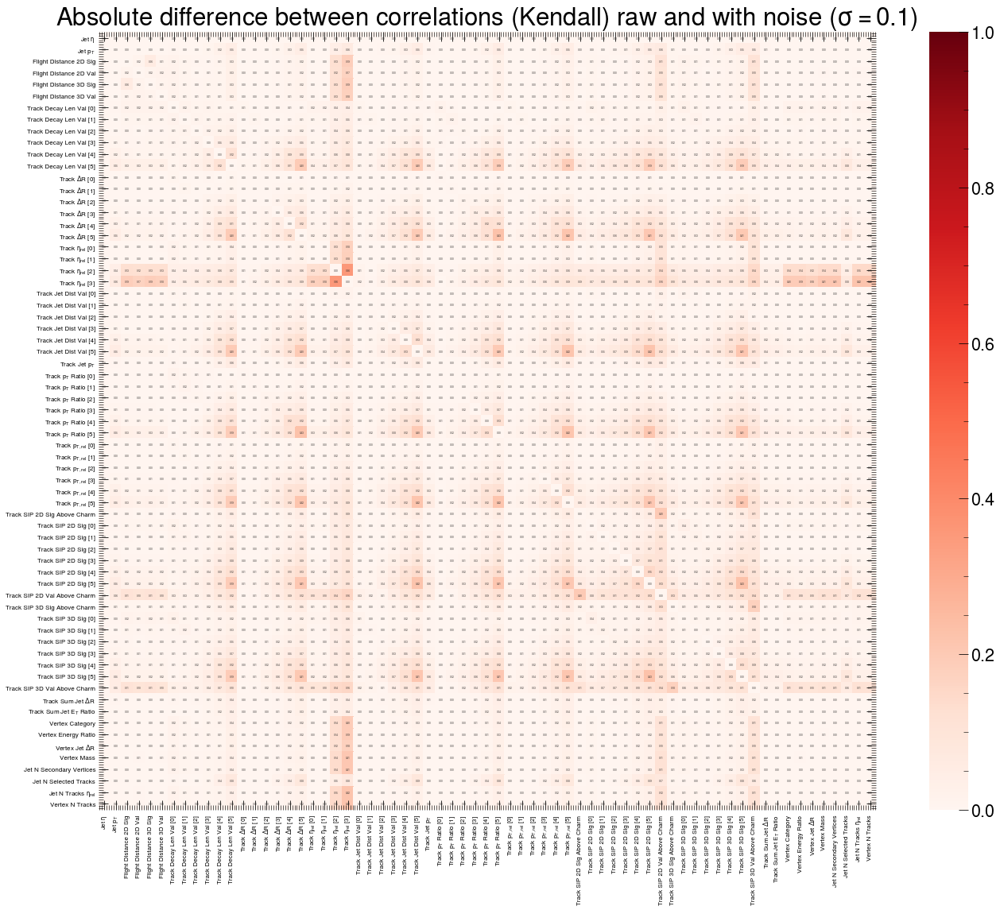

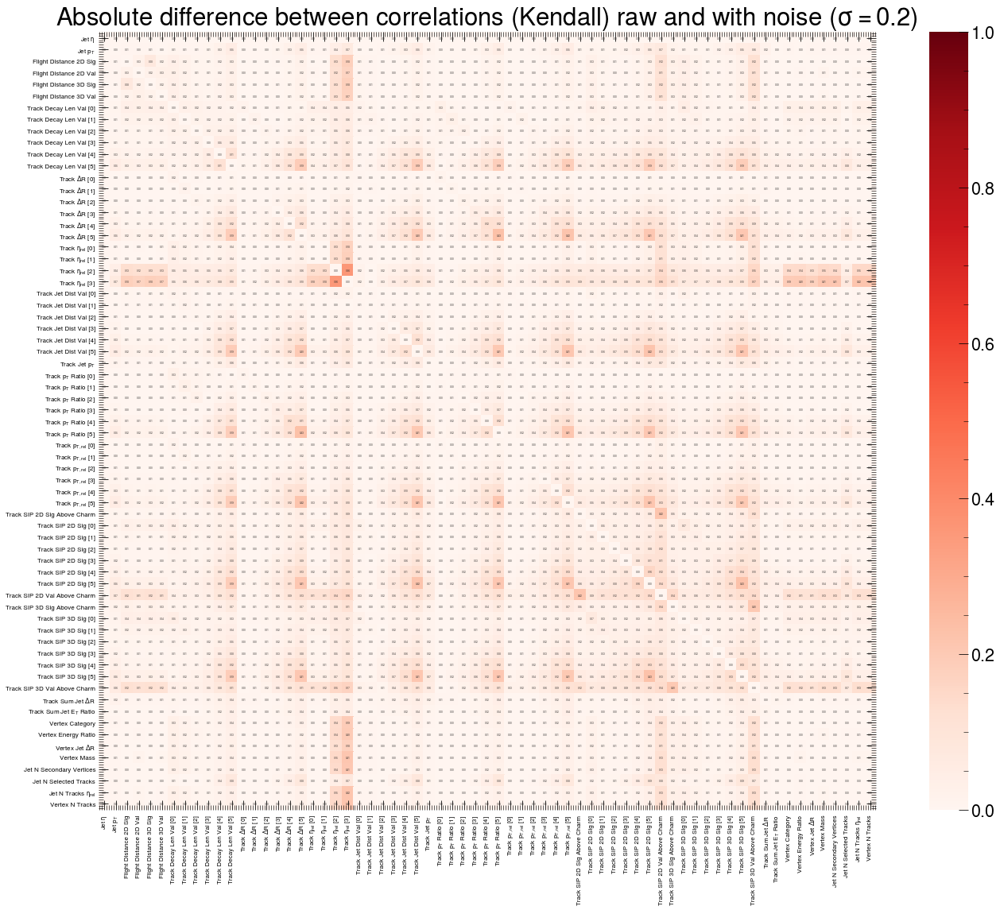

In [163]:
plot_diff_abs_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_diff_abs_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_diff_abs_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

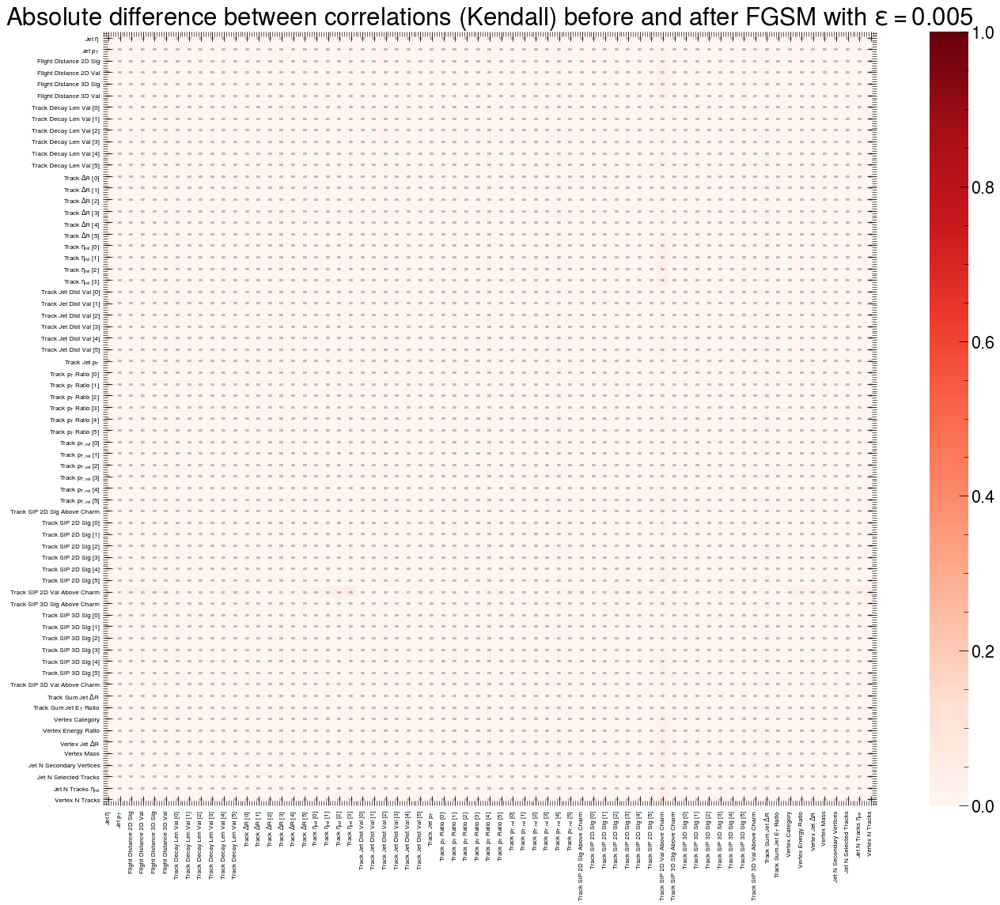

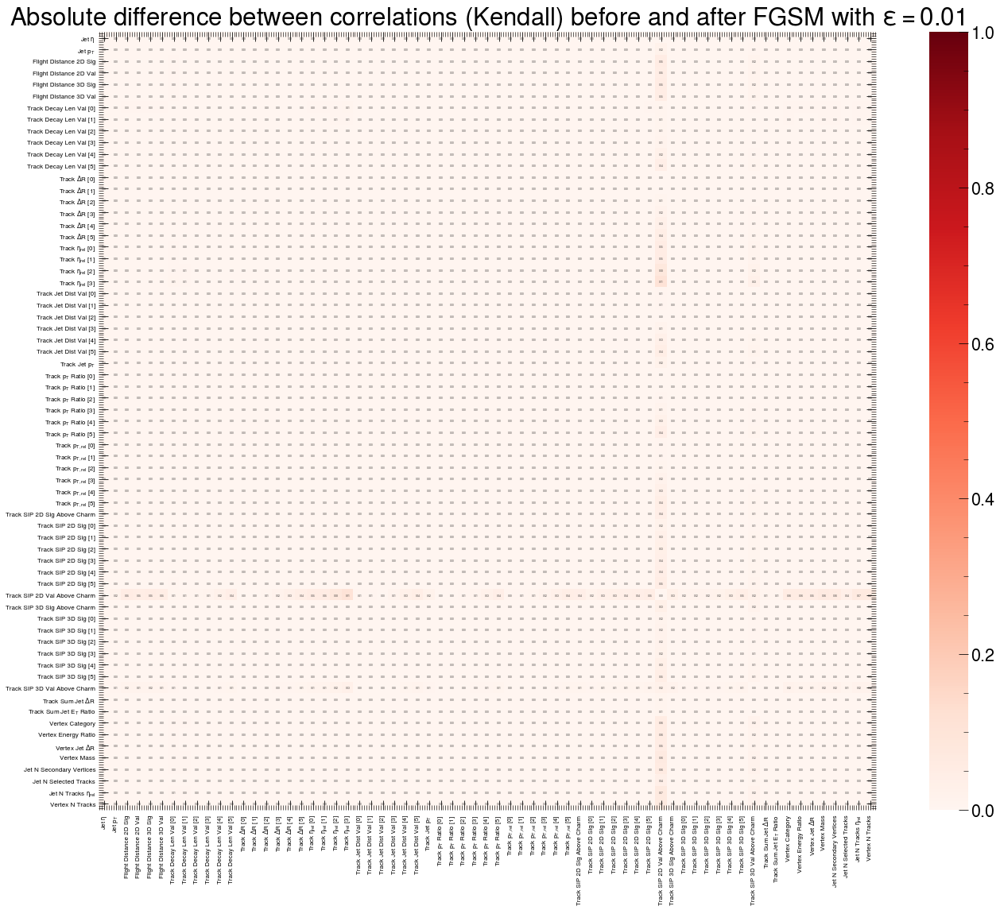

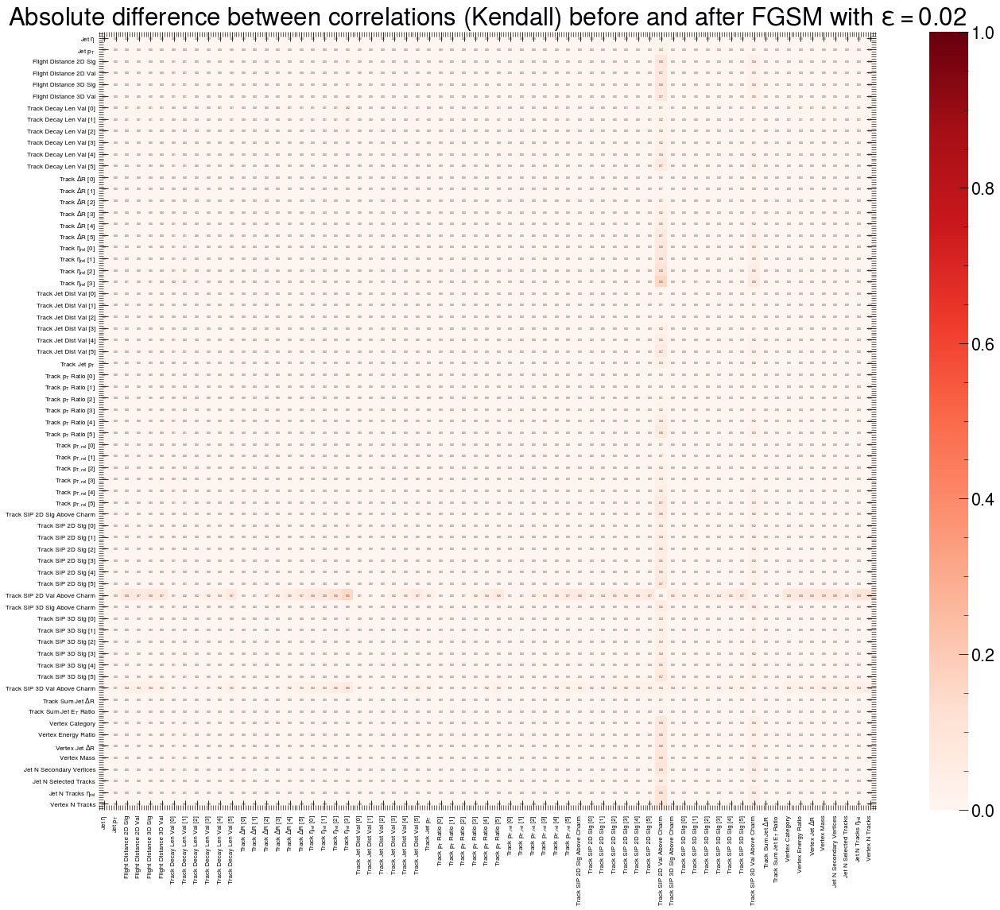

In [164]:
plot_diff_abs_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_diff_abs_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_diff_abs_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)